In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import matplotlib.pyplot as plt
import matplotlib as mpl
from cycler import cycler
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
import numpy as np
import scipy.stats as sps
import json, pickle, os, corner, glob, sys
from collections import defaultdict, OrderedDict
from copy import deepcopy
import enterprise.signals.utils as utils
from enterprise.pulsar import Pulsar
import pandas as pd

import enterprise
from enterprise.pulsar import Pulsar
from enterprise.signals import utils
from enterprise.signals import parameter
from enterprise.signals import white_signals
from enterprise.signals import signal_base
from enterprise.signals import selections

from PTMCMCSampler.PTMCMCSampler import PTSampler as ptmcmc

In [3]:
color_cycle_wong = ['#000000','#E69F00','#009E73','#56B4E9','#0072B2','#F0E442','#D55E00','#CC79A7']
mpl.rcParams['axes.prop_cycle'] = cycler(color=color_cycle_wong)

In [4]:
current_path = os.getcwd()
splt_path = current_path.split("/")
#top_path_idx = splt_path.index("akaiser")
top_path_idx = splt_path.index("nanograv")
top_dir = "/".join(splt_path[0 : top_path_idx + 1])

In [5]:
la_f_path = top_dir + "/la_forge"
sys.path.insert(0, la_f_path)
sys.path.insert(0, top_dir + "/enterprise_timing")
import nltm_plot_utils_v4 as nltm_plt
from nltm_J0340_setup_pta_v1 import pta_setup

import la_forge
import la_forge.diagnostics as dg
from la_forge.core import Core,TimingCore

In [6]:
psr_name = 'J2043+1711'#'J1640+2224'#'J2317+1439' 'J1909-3744'
datarelease = '9yr'
datadir = top_dir + "/{}".format(datarelease)
parfiles = sorted(glob.glob(datadir + "/par/*.par"))
timfiles = sorted(glob.glob(datadir + "/tim/*.tim"))
parfile = [pfile for pfile in parfiles if psr_name in pfile][0]
timfile = [tfile for tfile in timfiles if psr_name in tfile][0]

ephem = 'DE421'
psr = Pulsar(parfile, timfile, ephem=ephem, clk=None, drop_t2pulsar=False)

In [7]:
ptypes = ["normalized" for ii in range(len(psr.t2pulsar.pars()))]
tm_params_orig = OrderedDict(
        zip(
            psr.t2pulsar.pars(),
            map(
                list,
                zip(
                    np.longdouble(psr.t2pulsar.vals()),
                    np.longdouble(psr.t2pulsar.errs()),
                    ptypes,
                ),
            ),
        )
    )

In [8]:
[print(p,z,e) for p,z,e in zip(psr.t2pulsar.pars(),psr.t2pulsar.vals(),psr.t2pulsar.errs())];

ELONG 5.5653050058418854695 0.0
ELAT 0.5927893201718660373 nan
F0 420.189443268537957 1.8852000000000000854e-12
F1 -9.256520485197e-16 1.8511942069629999653e-19
PMELONG -8.9698 0.07389999999999999347
PMELAT -8.5154 0.13070000000000001061
PX 0.7777 0.19079999999999999738
SINI 0.99324 0.0016160000000000000319
PB 1.4822907864878 1.4980999999999999759e-10
A1 1.623958382 2.1699999999999999759e-07
TASC 56174.306240718 1.0000000000000000209e-08
EPS1 -4.2531e-06 1.3979999999999999452e-07
EPS2 -2.4154e-06 9.279999999999999718e-08
M2 0.172879 0.014890999999999999723
FD1 -1.13799988e-06 3.528165000000000147e-07
DMX_0001 0.00108706311 6.775353360000000097e-05
DMX_0002 0.00111905576 6.965188740000000057e-05
DMX_0003 0.00112794712 6.746123060000000222e-05
DMX_0004 0.00117803762 6.73917629000000013e-05
DMX_0005 0.00108123199 6.7069391199999997153e-05
DMX_0006 0.0010216804 0.00013017460199999999755
DMX_0007 0.000967672328 0.00020648765699999999394
DMX_0008 0.000857156062 0.00012939806600000000407
DMX_

In [9]:
par = 'SINI'
value = 2000
print(tm_params_orig[par][0])
print(tm_params_orig[par][1])
print(tm_params_orig[par][0]+tm_params_orig[par][1]*value)
tm_delay_kwargs = {par:value}
#psr.tm_params_orig

0.99324
0.0016160000000000000319
4.225240000000000064


{'SINI': 4.225240000000000064}


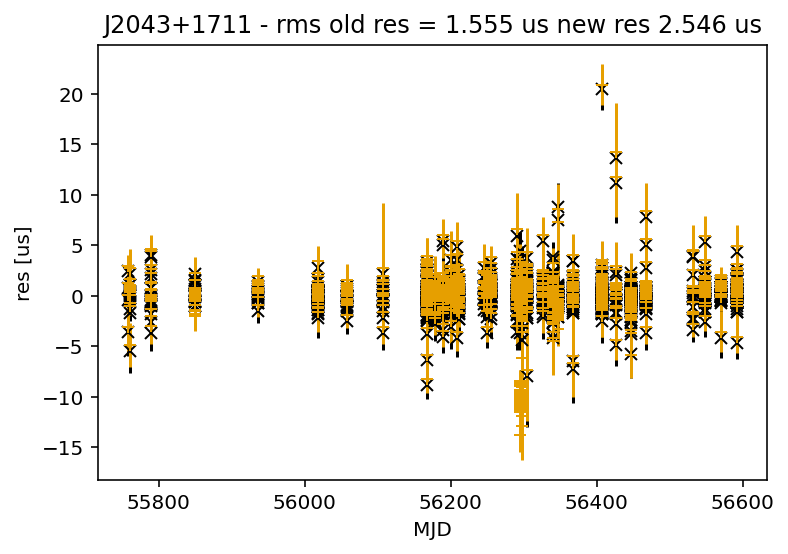

In [10]:
nltm_plt.tm_delay(psr.t2pulsar,tm_params_orig,**tm_delay_kwargs);

In [11]:
nltm_plt.refit_errs(psr,tm_params_orig)

ELONG 2.8696405959492981048e-10
ELAT 5.3561081754962250934e-10
JUMP1 9.932086628184715801e-07


{'ELONG': 5.5653052928059450646}


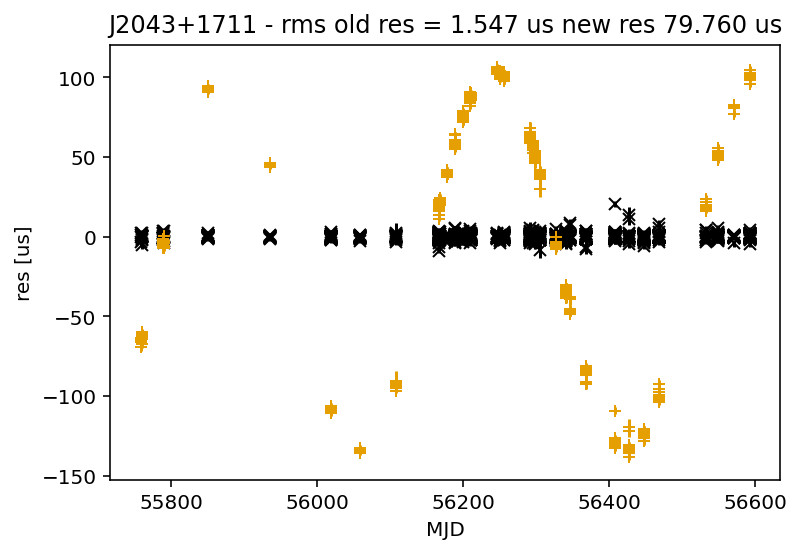

{'ELAT': 0.5927898557826835869}


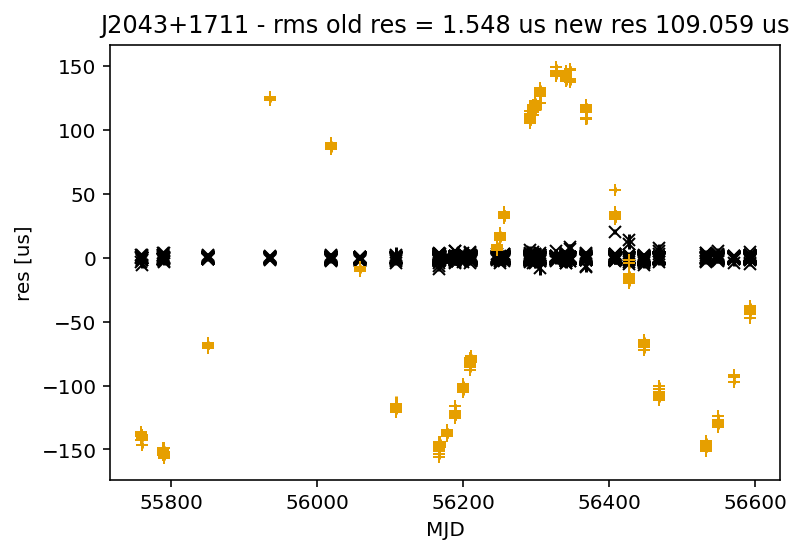

{'F0': 420.189443270423157}


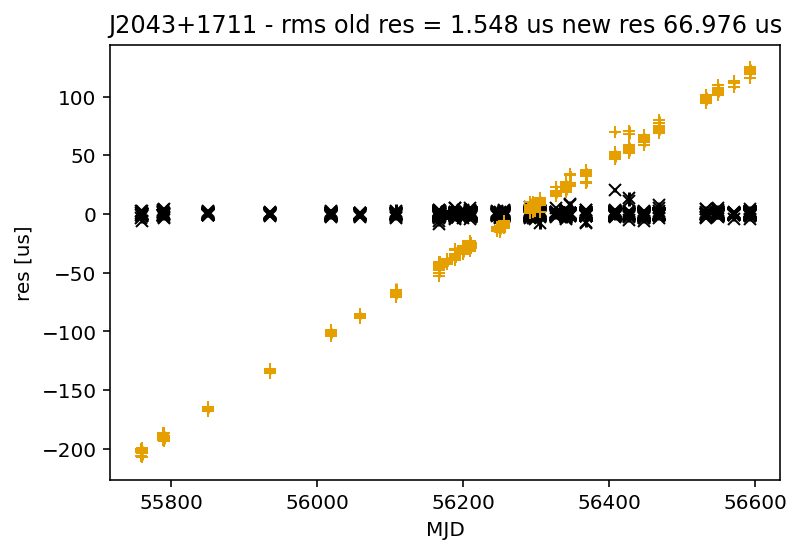

{'F1': -7.4053262782340000345e-16}


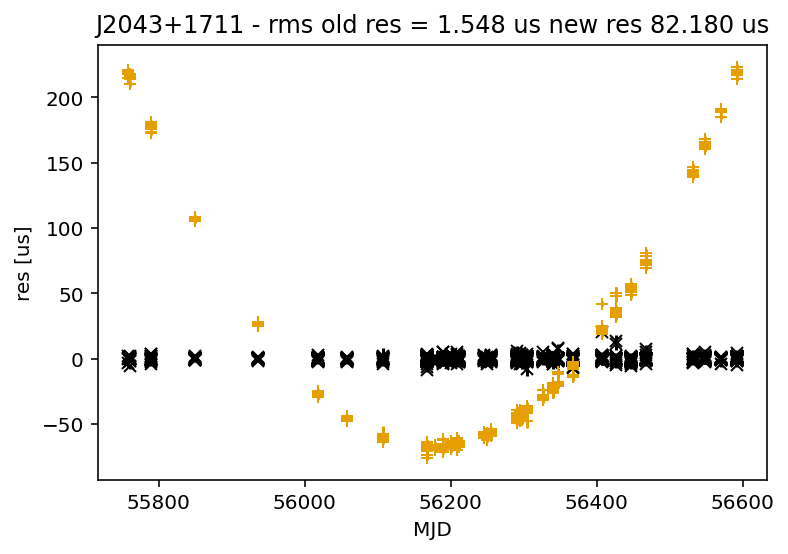

{'PMELONG': 64.93019999999999347}


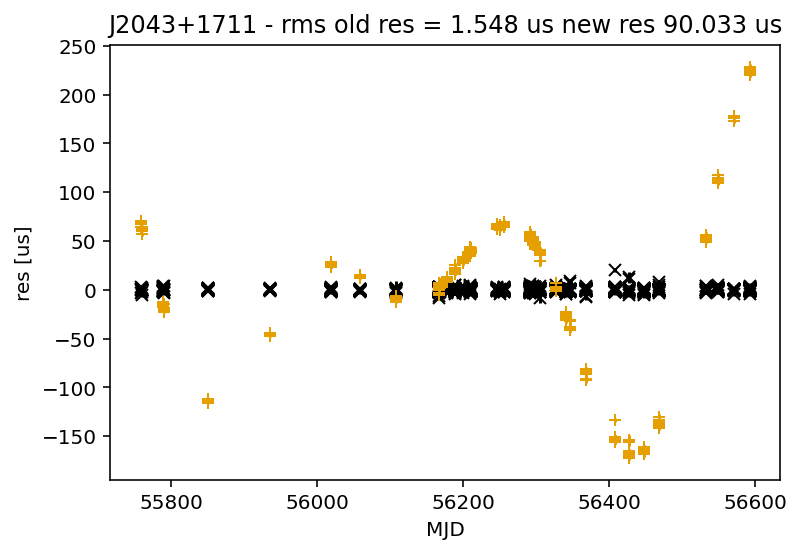

{'PMELAT': 122.18460000000001062}


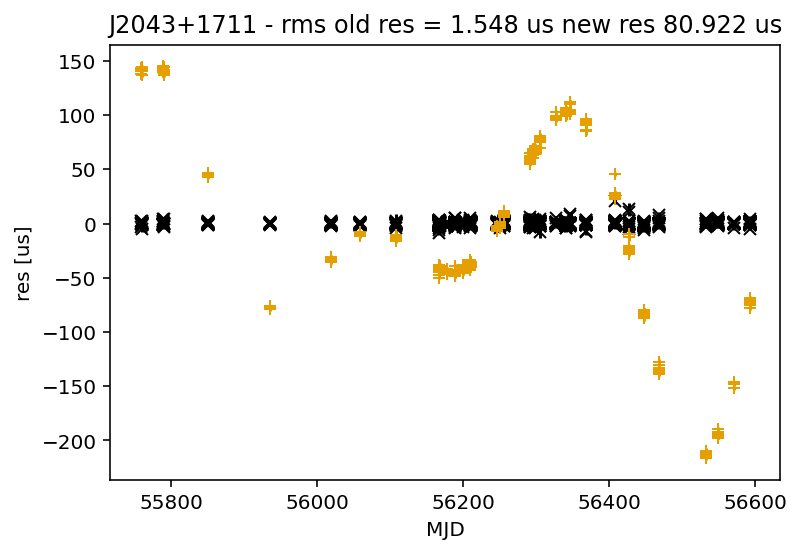

{'PX': 191.57769999999999738}


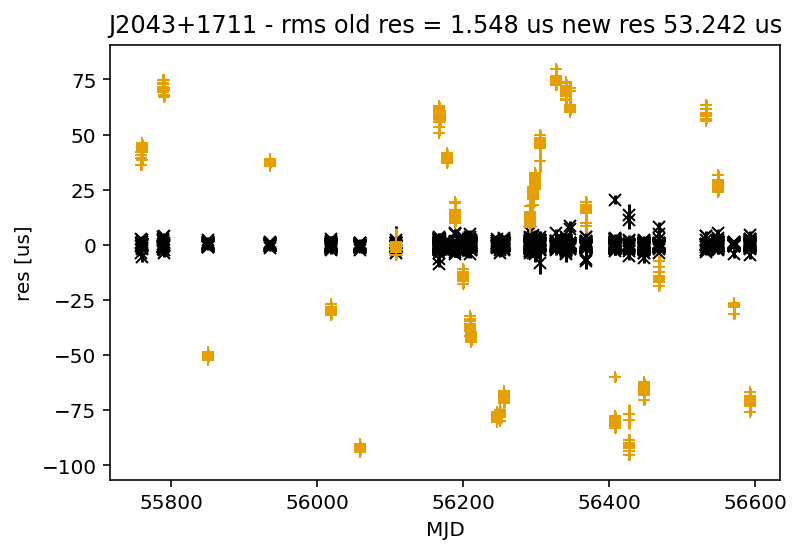

{'SINI': 2.609240000000000032}


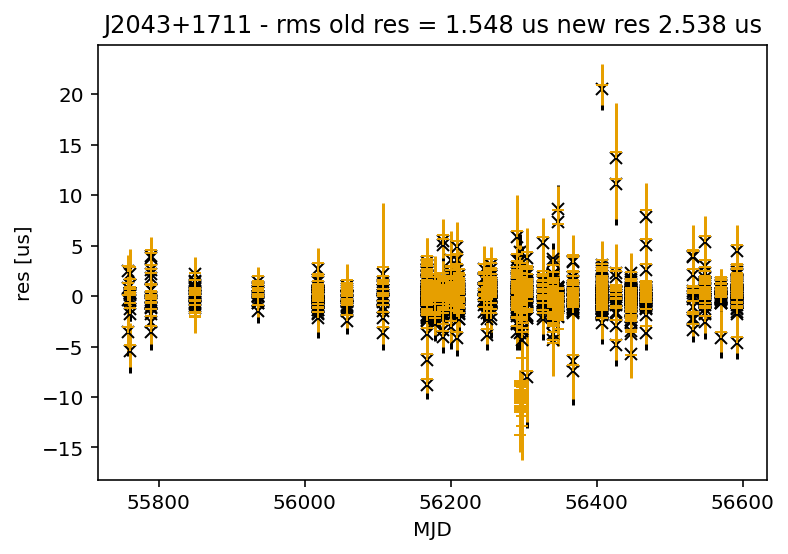

{'PB': 1.4822909362978}


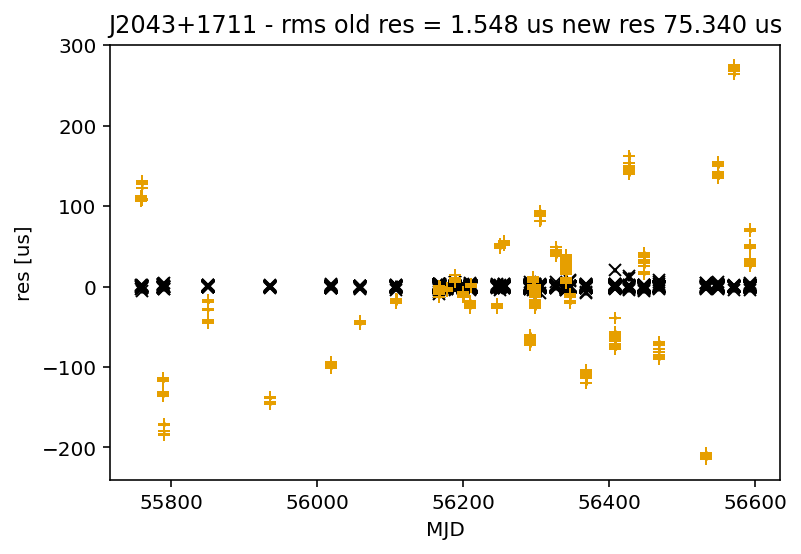

{'A1': 1.624175382}


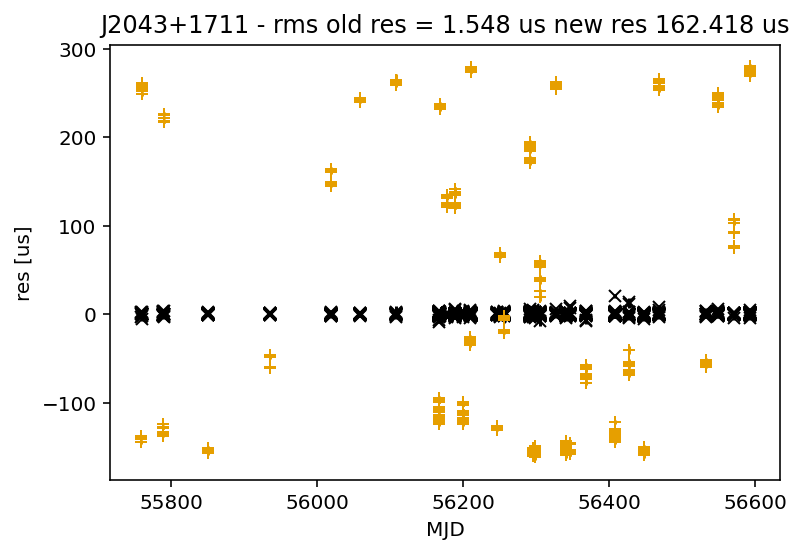

{'TASC': 56174.306250718}


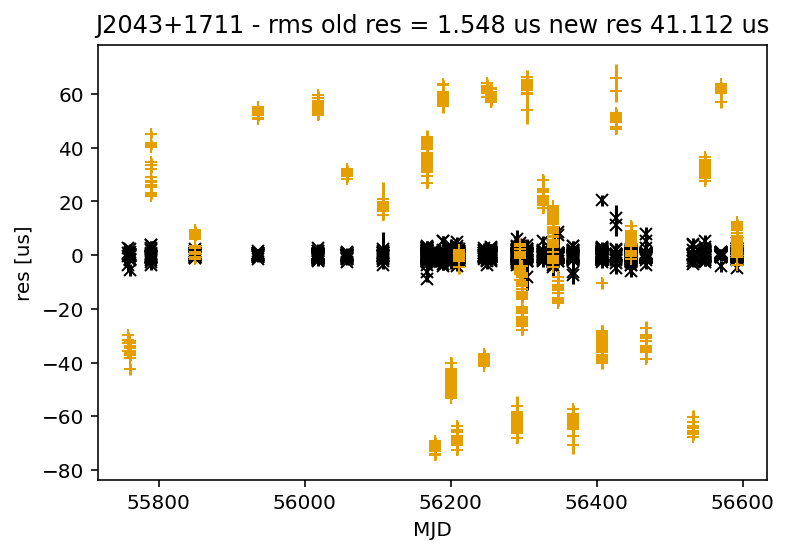

{'EPS1': 0.00013554689999999999452}


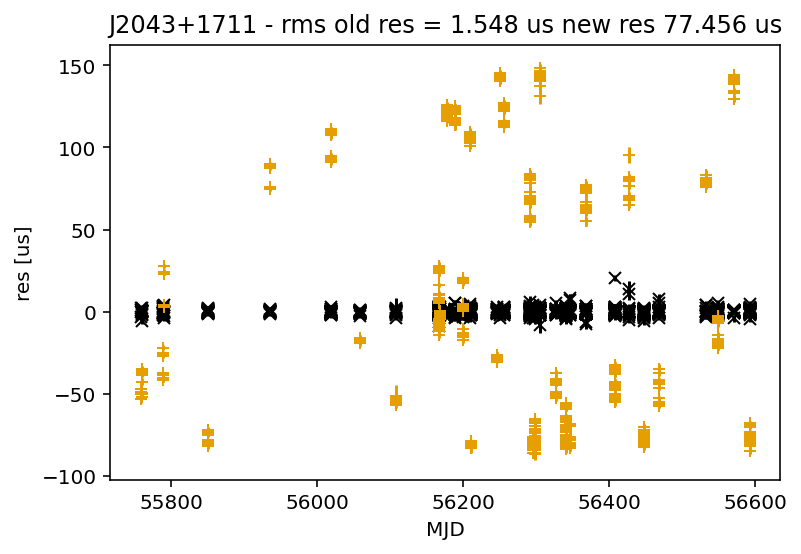

{'EPS2': 9.0384599999999997174e-05}


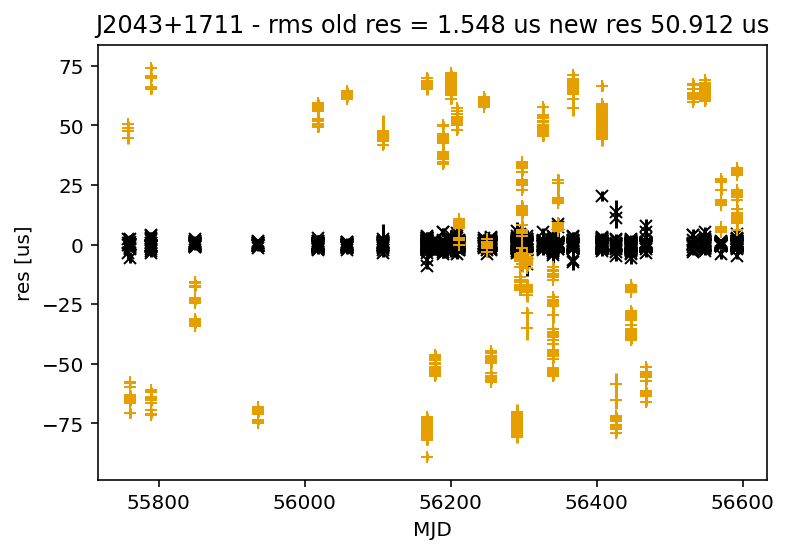

{'M2': 15.0638789999999997225}


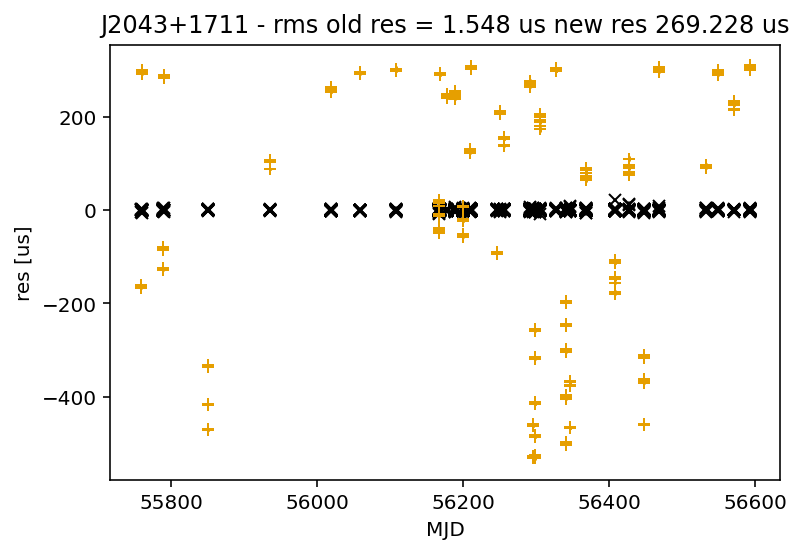

{'FD1': 0.00035167850012000001472}


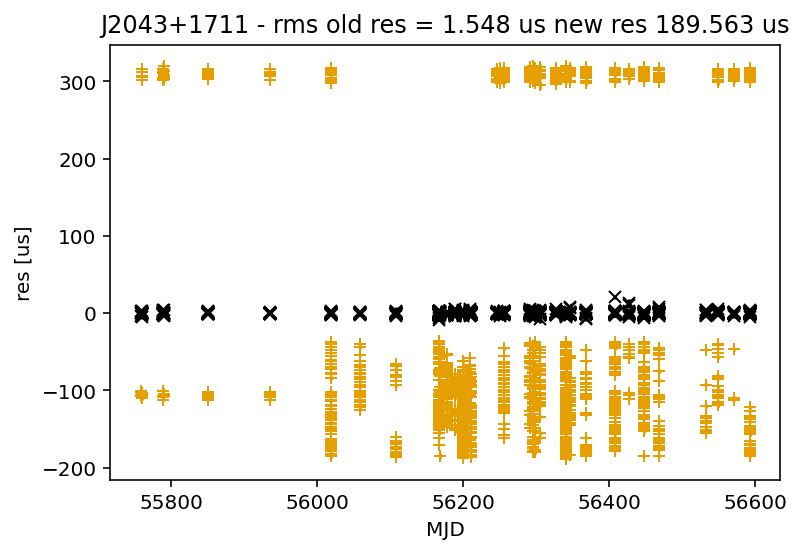

{'DMX_0001': 0.06884059671000000097}


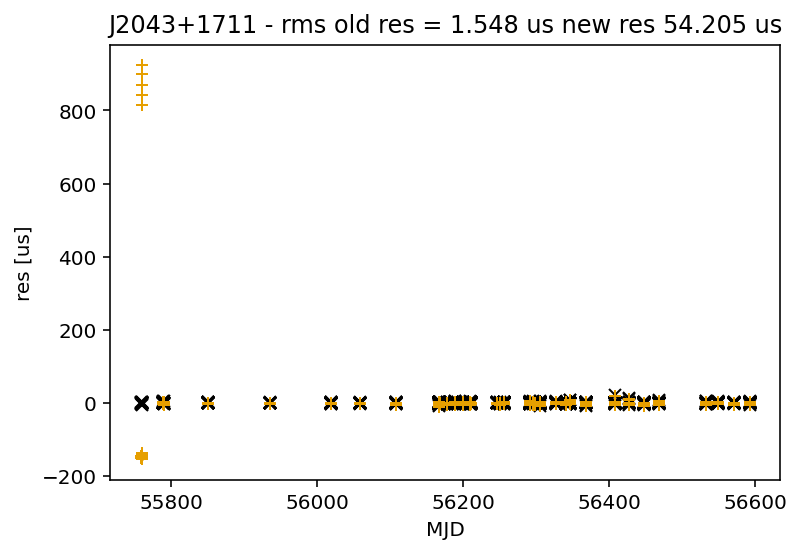

{'DMX_0002': 0.07077094316000000057}


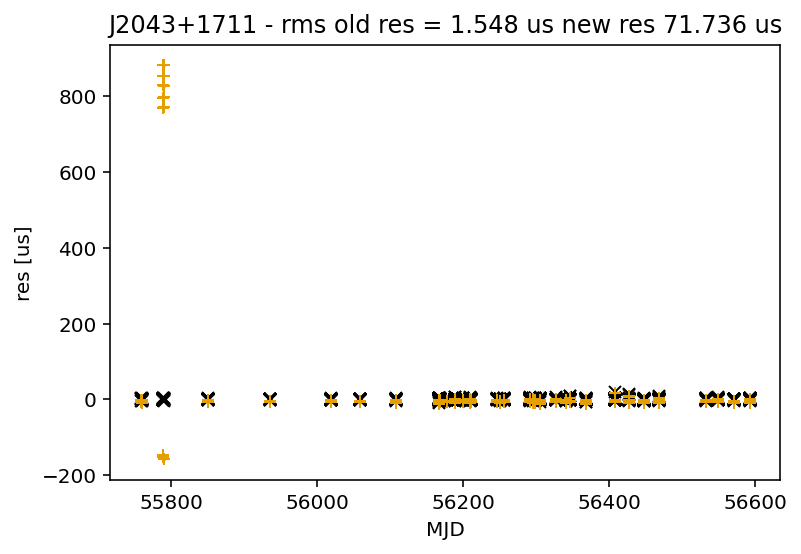

{'DMX_0003': 0.068589177720000002225}


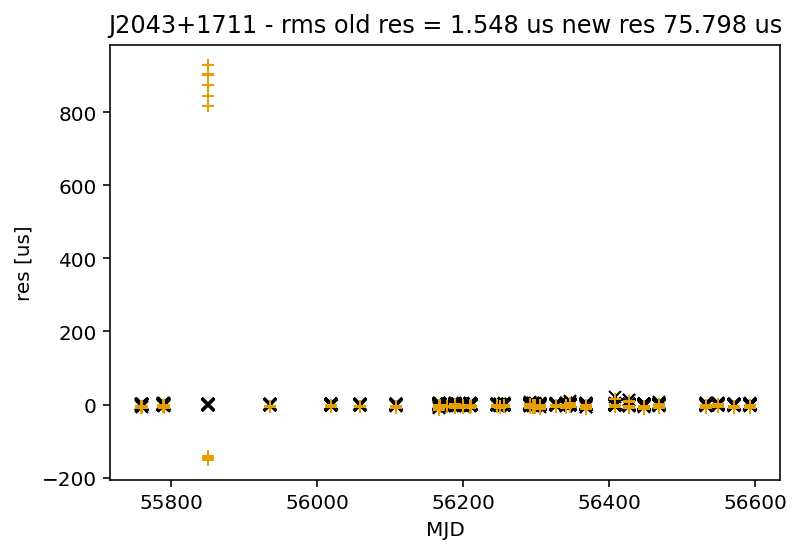

{'DMX_0004': 0.0685698005200000013}


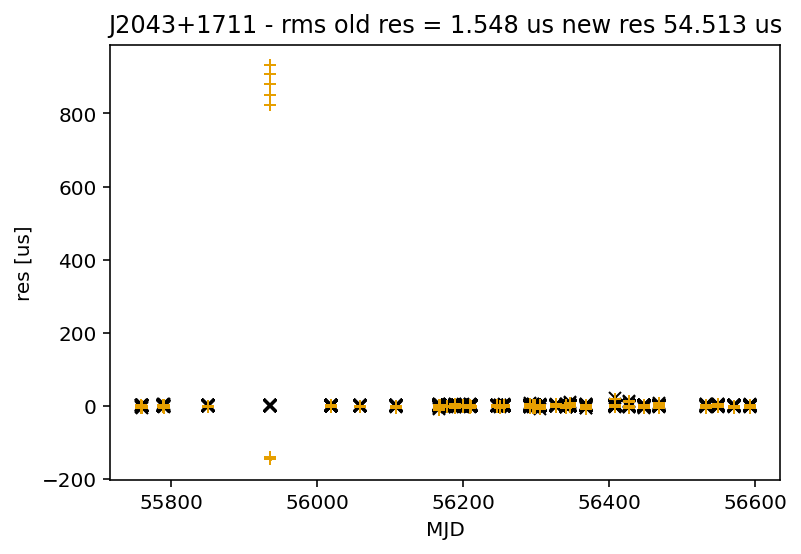

{'DMX_0005': 0.06815062318999999715}


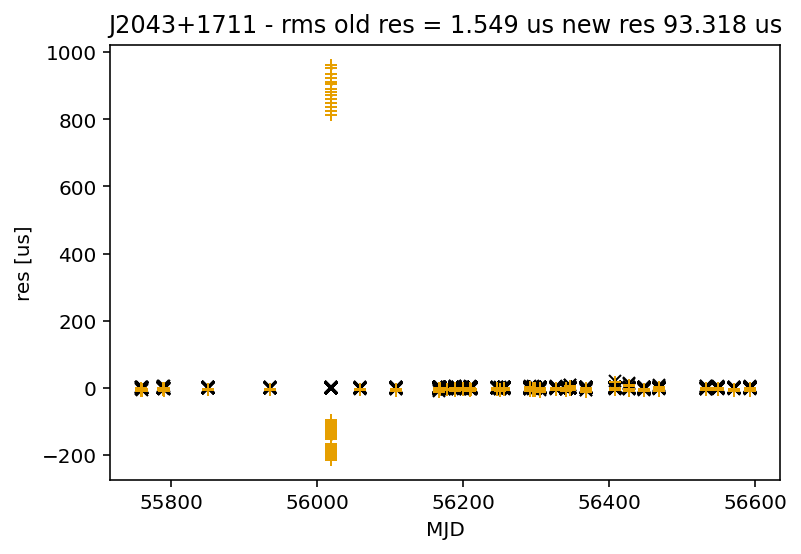

{'DMX_0006': 0.13119628239999999755}


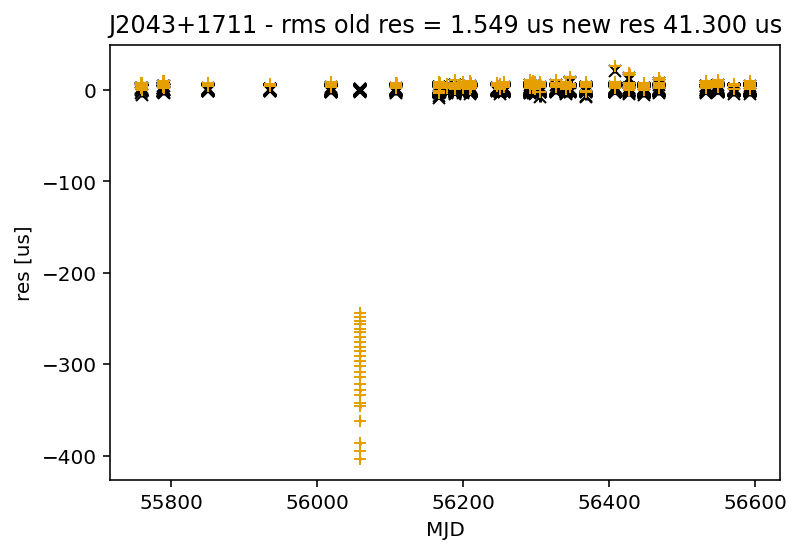

{'DMX_0007': 0.20745532932799999395}


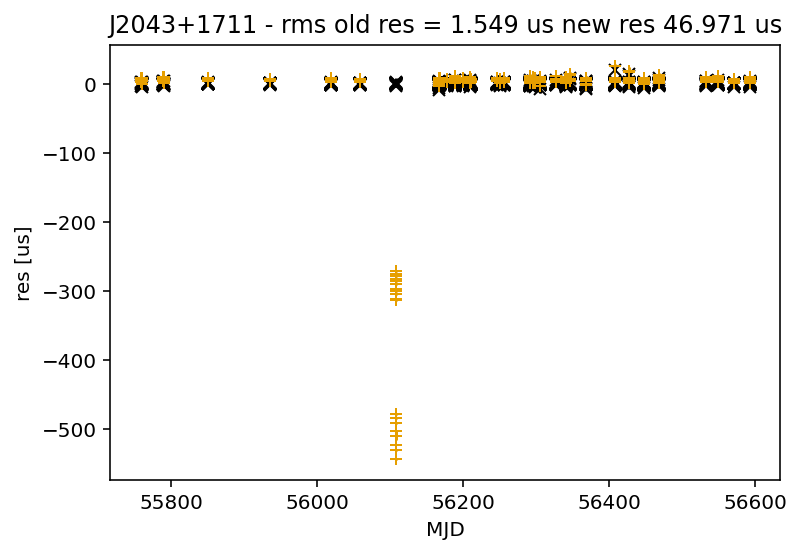

{'DMX_0008': 0.13025522206200000407}


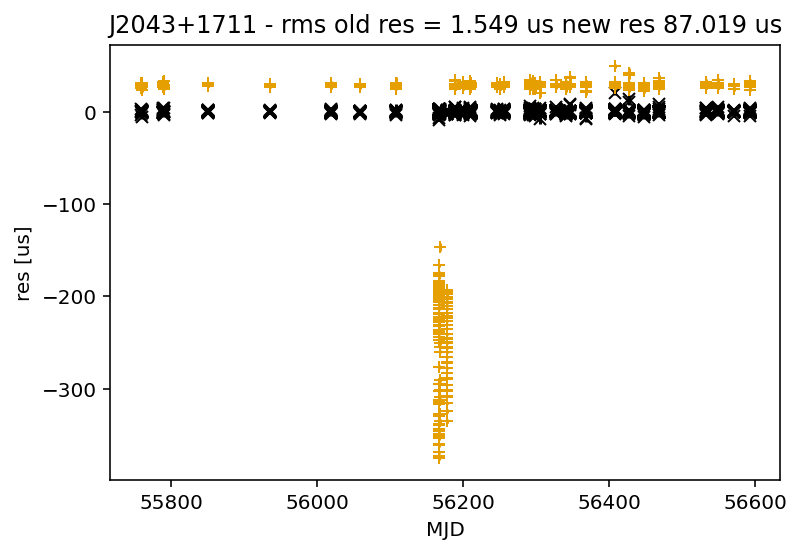

{'DMX_0009': 0.13084416306600001304}


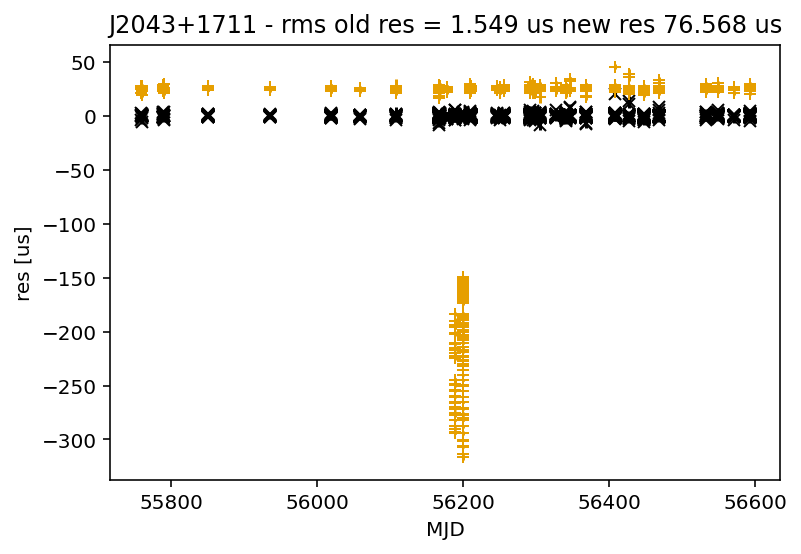

{'DMX_0010': 0.13640856919099999449}


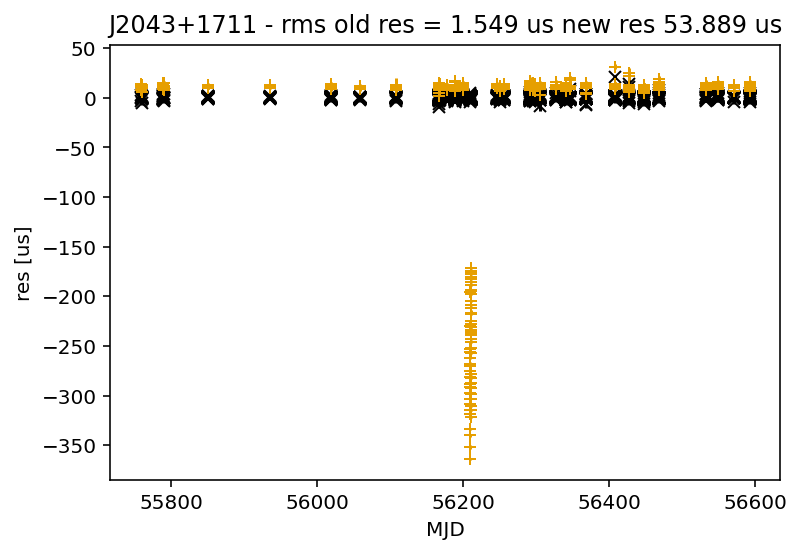

{'DMX_0011': 0.06697226075000000014}


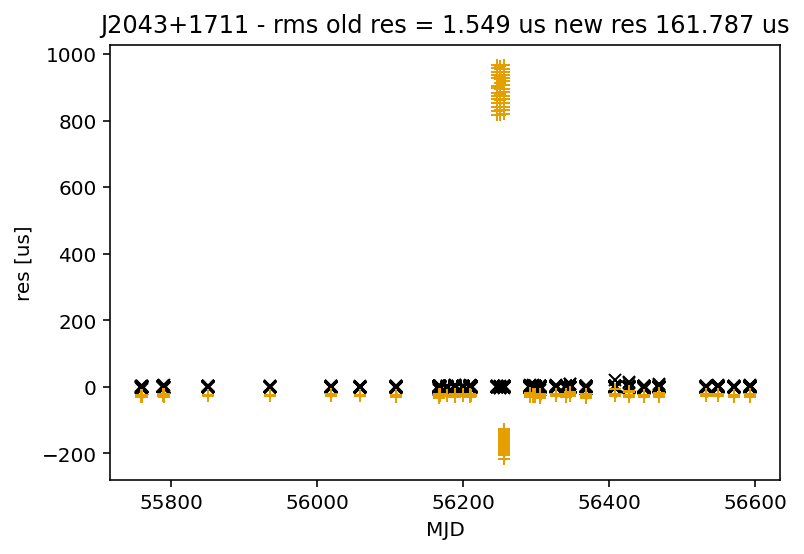

{'DMX_0012': 0.06659633225999999614}


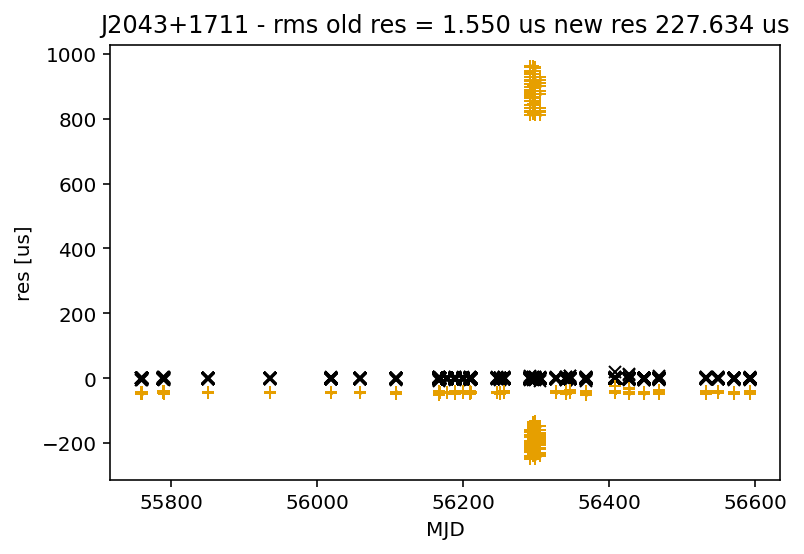

{'DMX_0013': 0.06741997999999999395}


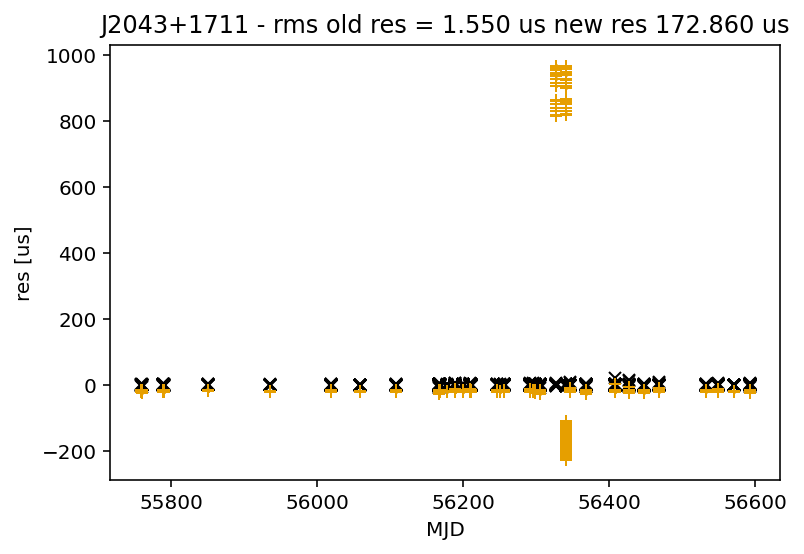

{'DMX_0014': 0.06873631241999999767}


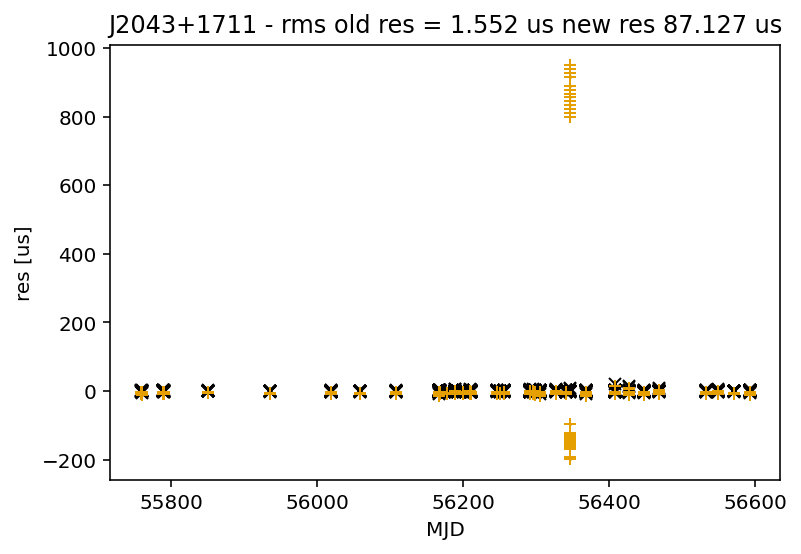

{'DMX_0015': 0.07004428689999999912}


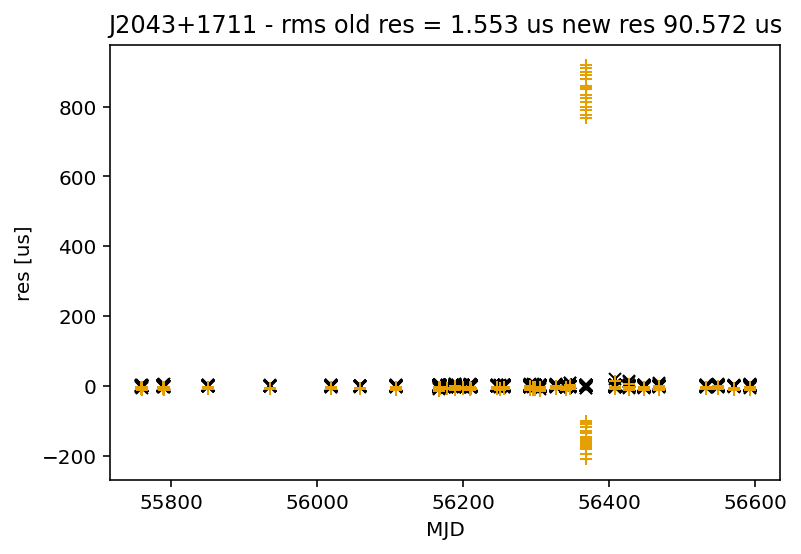

{'DMX_0016': 0.06990132733000000659}


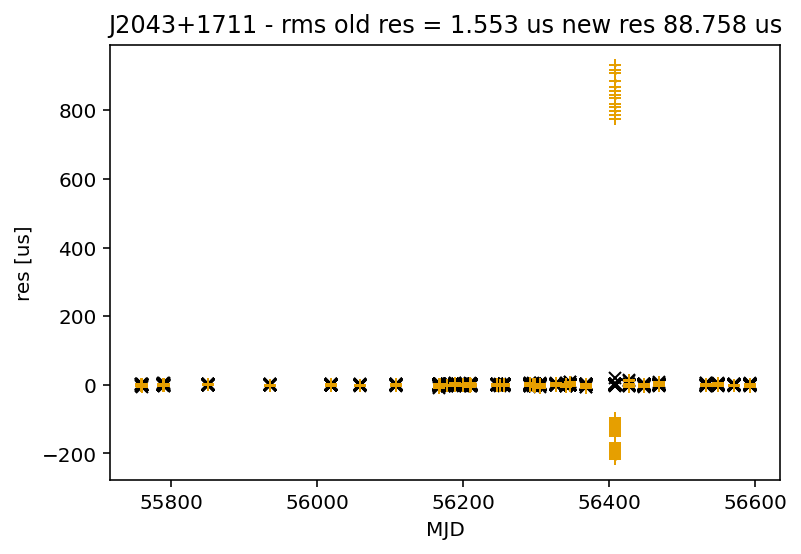

{'DMX_0017': 0.069479249644999993653}


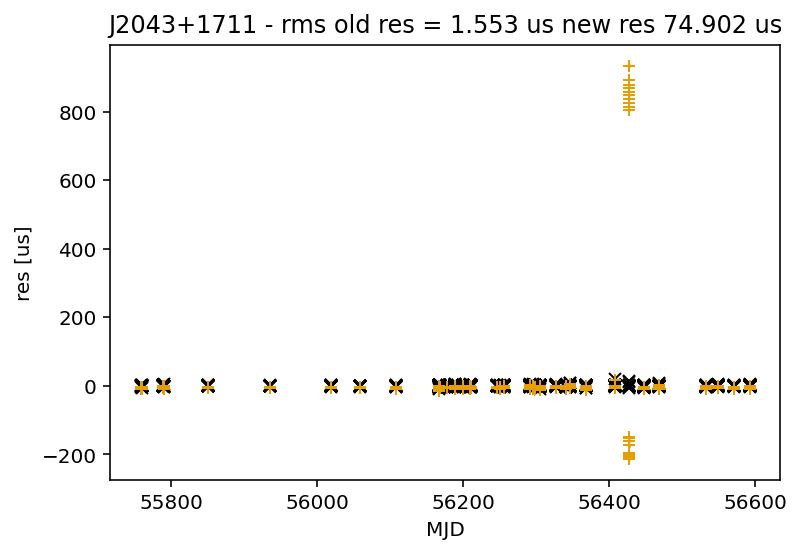

{'DMX_0018': 0.068870897725000005024}


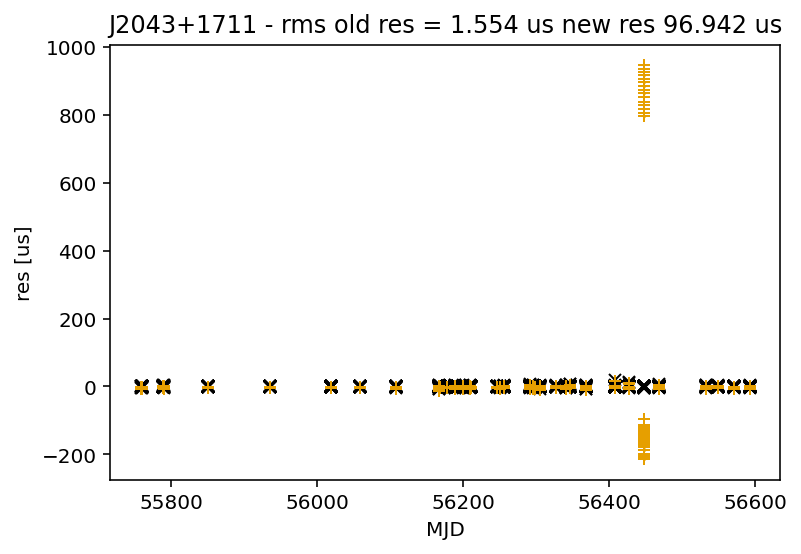

{'DMX_0019': 0.06979988169100000617}


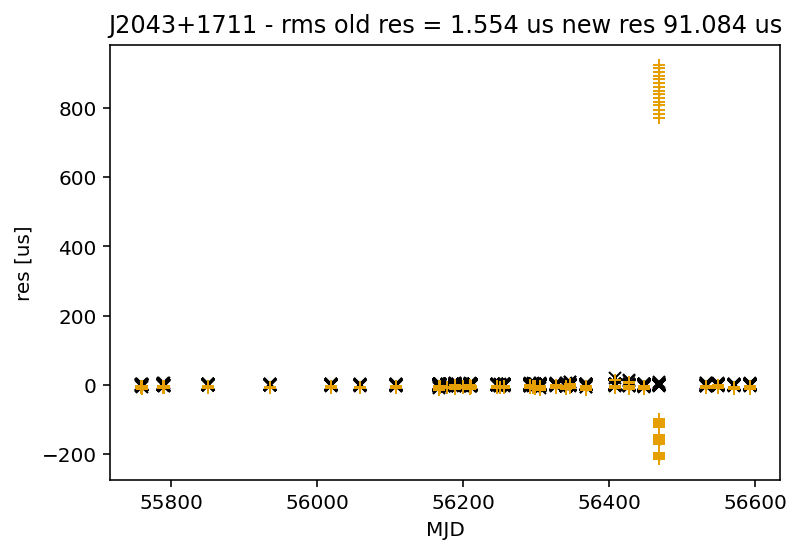

{'DMX_0020': 0.32929076088300001868}


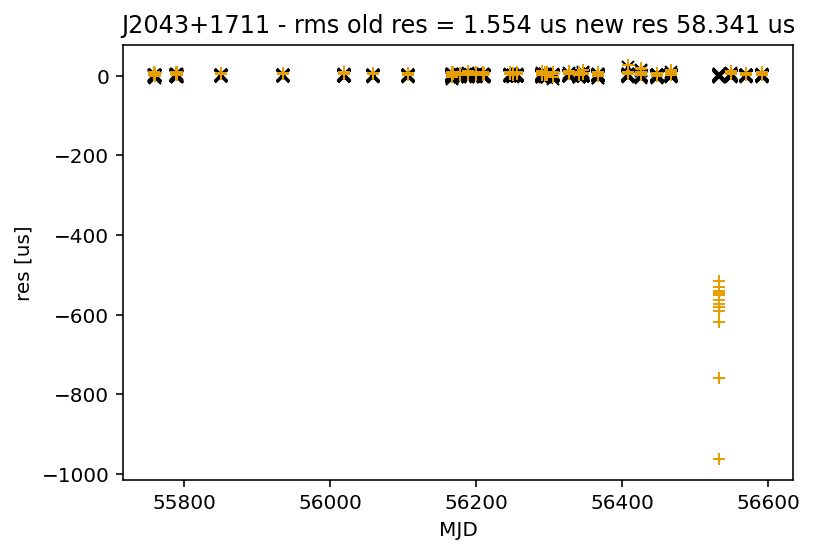

{'DMX_0021': 0.069832745898999997014}


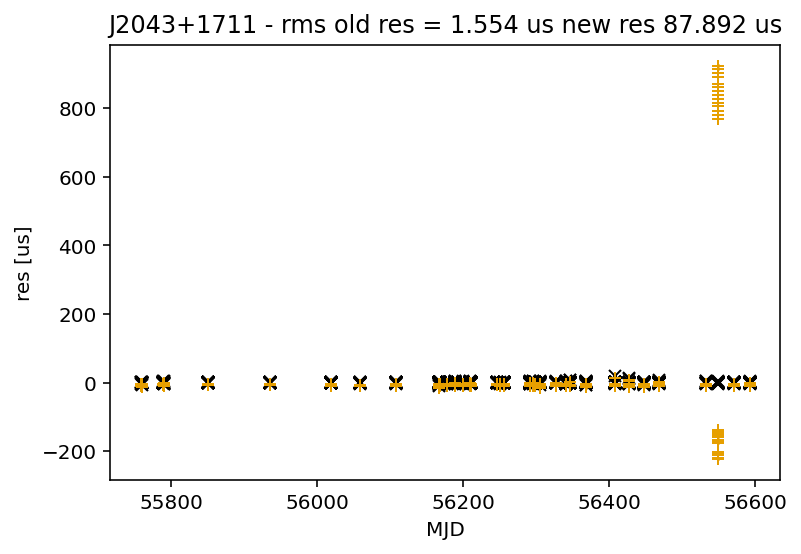

{'DMX_0022': 0.06723539460199999545}


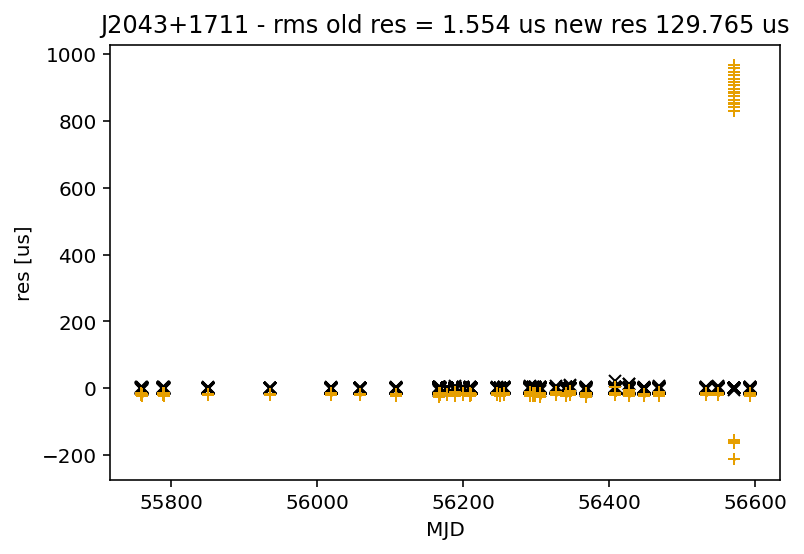

{'DMX_0023': 0.06724562212200000394}


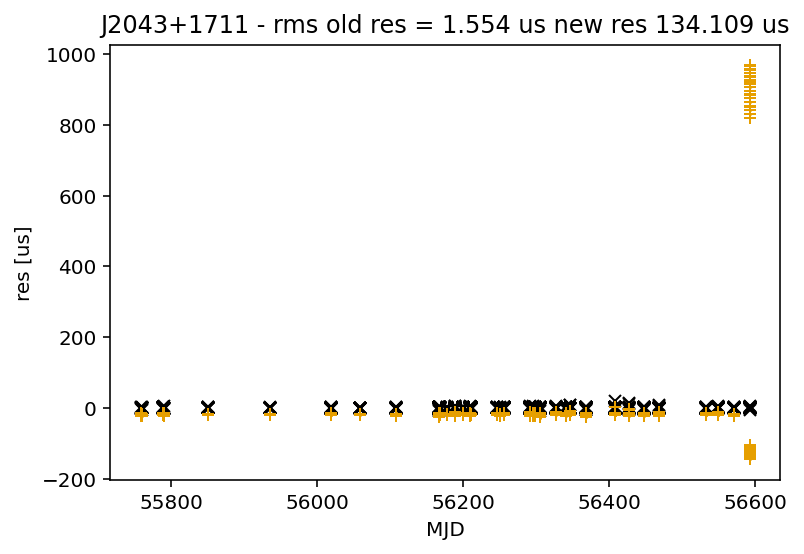

{'JUMP1': 0.0009852826628184715801}


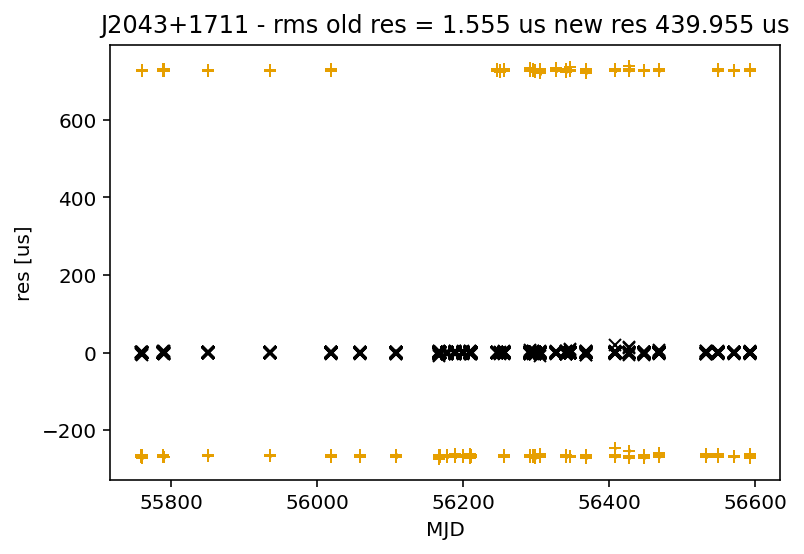

In [12]:
value = 1000.
for par in psr.t2pulsar.pars():
    tm_delay_kwargs = {par:value}
    nltm_plt.tm_delay(psr.t2pulsar,tm_params_orig,**tm_delay_kwargs);
    plt.show()

# Loading runs for MLVs

In [13]:
psr_dir = current_path + f'/{psr_name}/chains/'
#PAL2 Priors
chaindir_core_9yr_DE421_noRN_varyWN_full_nltm_1 = psr_dir+f'9yr/{psr_name}_uniform_DE421_nltm_ltm_noRN_varyWN_full_nltm_1'
chaindir_core_9yr_DE421_noRN_varyWN_noise_only_1 = psr_dir+f'9yr/{psr_name}_uniform_DE421_nltm_ltm_noRN_varyWN_noise_only_1'
chaindir_core_9yr_DE421_noRN_varyWN_lin_DMX_FD_JUMP_etc_1 = psr_dir+f'9yr/{psr_name}_uniform_DE421_nltm_ltm_noRN_varyWN_lin_DMX_FD_JUMP_etc_1'
chaindir_core_9yr_DE421_noRN_varyWN_lin_DMX_FD_JUMP_etc_500_sigma_1 = psr_dir+f'9yr/{psr_name}_uniform_DE421_nltm_ltm_noRN_varyWN_lin_DMX_FD_JUMP_etc_500_sigma_1'

burn=None
core_9yr_DE421_noRN_varyWN_full_nltm_1 = TimingCore('_'.join(chaindir_core_9yr_DE421_noRN_varyWN_full_nltm_1.split('/')[-2:]),
                              chaindir=chaindir_core_9yr_DE421_noRN_varyWN_full_nltm_1,
                              tm_pars_path=chaindir_core_9yr_DE421_noRN_varyWN_full_nltm_1+'/orig_timing_pars.pkl',
                              burn=burn)

core_9yr_DE421_noRN_varyWN_noise_only_1 = Core('_'.join(chaindir_core_9yr_DE421_noRN_varyWN_noise_only_1.split('/')[-2:]),
                              chaindir=chaindir_core_9yr_DE421_noRN_varyWN_noise_only_1,
                              burn=burn)

core_9yr_DE421_noRN_varyWN_lin_DMX_FD_JUMP_etc_1 = TimingCore('_'.join(chaindir_core_9yr_DE421_noRN_varyWN_lin_DMX_FD_JUMP_etc_1.split('/')[-2:]),
                              chaindir=chaindir_core_9yr_DE421_noRN_varyWN_lin_DMX_FD_JUMP_etc_1,
                              tm_pars_path=chaindir_core_9yr_DE421_noRN_varyWN_lin_DMX_FD_JUMP_etc_1+'/orig_timing_pars.pkl',
                              burn=burn)

core_9yr_DE421_noRN_varyWN_lin_DMX_FD_JUMP_etc_500_sigma_1 = TimingCore('_'.join(chaindir_core_9yr_DE421_noRN_varyWN_lin_DMX_FD_JUMP_etc_500_sigma_1.split('/')[-2:]),
                              chaindir=chaindir_core_9yr_DE421_noRN_varyWN_lin_DMX_FD_JUMP_etc_500_sigma_1,
                              tm_pars_path=chaindir_core_9yr_DE421_noRN_varyWN_lin_DMX_FD_JUMP_etc_500_sigma_1+'/orig_timing_pars.pkl',
                              burn=burn)

Appending PTMCMCSampler sampling parameters to end of parameter list.
If unwanted please provide a parameter list.
No burn specified. Burn set to 25% of chain length, 24975
You may change the burn length with core.set_burn()
Red noise frequencies must be set before plotting most red noise figures.
Please use core.set_rn_freqs() to set, if needed.
Appending PTMCMCSampler sampling parameters to end of parameter list.
If unwanted please provide a parameter list.
No burn specified. Burn set to 25% of chain length, 24975
You may change the burn length with core.set_burn()
Red noise frequencies must be set before plotting most red noise figures.
Please use core.set_rn_freqs() to set, if needed.
Appending PTMCMCSampler sampling parameters to end of parameter list.
If unwanted please provide a parameter list.
No burn specified. Burn set to 25% of chain length, 24975
You may change the burn length with core.set_burn()
Red noise frequencies must be set before plotting most red noise figures.
Ple

In [14]:
core_list_9yr_e_e = [core_9yr_DE421_noRN_varyWN_lin_DMX_FD_JUMP_etc_1,
                     core_9yr_DE421_noRN_varyWN_lin_DMX_FD_JUMP_etc_500_sigma_1,
                     core_9yr_DE421_noRN_varyWN_noise_only_1]
core_list_legend_9yr_e_e = ['e_e nltm+ltm no RN varied WN PAL2 Priors, linear DMX,JUMP,FD,F0,F1,ELAT,ELONG',
                            'e_e nltm+ltm no RN varied WN PAL2 Priors, linear DMX,JUMP,FD,F0,F1,ELAT,ELONG no PT, 500 sigma',
                            'e_e nltm no RN varied WN noise only']

In [15]:
burn=None

chaindir_PAL2_9yr_nltm_ltm_noRN_varyWN_lin_DMX_FD_JUMP_etc_1 = top_dir + f'/enterprise_timing/{psr_name}/ark_PAL2/PAL2_nltm_ltm_noRN_varyWN_lin_DMX_FD_JUMP_etc_1'
chaindir_PAL2_9yr_noRN_vary_WN_noise_only_1 = top_dir + f'/enterprise_timing/{psr_name}/ark_PAL2/PAL2_noRN_varyWN_noise_only_1'

enterprise_equiv_pars_noise_only = ['J2043+1711_430_PUPPI_efac', 'J2043+1711_L-wide_PUPPI_efac',
                                     'J2043+1711_430_ASP_efac', 'J2043+1711_L-wide_ASP_efac',
                                     'J2043+1711_430_ASP_log10_ecorr', 'J2043+1711_430_PUPPI_log10_ecorr',
                                     'J2043+1711_L-wide_ASP_log10_ecorr', 'J2043+1711_L-wide_PUPPI_log10_ecorr',
                                     'J2043+1711_430_PUPPI_log10_equad', 'J2043+1711_L-wide_PUPPI_log10_equad',
                                     'J2043+1711_430_ASP_log10_equad', 'J2043+1711_L-wide_ASP_log10_equad',]
enterprise_equiv_pars = ['J2043+1711_430_PUPPI_efac', 'J2043+1711_L-wide_PUPPI_efac',
                         'J2043+1711_430_ASP_efac', 'J2043+1711_L-wide_ASP_efac',
                         'J2043+1711_430_ASP_log10_ecorr', 'J2043+1711_430_PUPPI_log10_ecorr',
                         'J2043+1711_L-wide_ASP_log10_ecorr', 'J2043+1711_L-wide_PUPPI_log10_ecorr',
                         'J2043+1711_430_PUPPI_log10_equad', 'J2043+1711_L-wide_PUPPI_log10_equad',
                         'J2043+1711_430_ASP_log10_equad', 'J2043+1711_L-wide_ASP_log10_equad',
                         'J2043+1711_timing_model_PMELONG', 'J2043+1711_timing_model_PMELAT',
                         'J2043+1711_timing_model_PX', 'J2043+1711_timing_model_SINI',
                         'J2043+1711_timing_model_PB', 'J2043+1711_timing_model_A1',
                         'J2043+1711_timing_model_TASC', 'J2043+1711_timing_model_EPS1',
                         'J2043+1711_timing_model_EPS2', 'J2043+1711_timing_model_M2']

chain_PAL2_9yr_noRN_vary_WN_noise_only_1 = pd.read_csv(chaindir_PAL2_9yr_noRN_vary_WN_noise_only_1+'/chain_1.txt',
                                                          sep='\t', dtype=float, header=None).values
core_PAL2_9yr_noRN_vary_WN_noise_only_1 = Core('PAL2_9yr_noRN_vary_WN_noise_only_1',
                                                  chain=chain_PAL2_9yr_noRN_vary_WN_noise_only_1,
                                                  params=enterprise_equiv_pars_noise_only.copy(),
                                                  burn=burn)

chain_PAL2_9yr_nltm_ltm_noRN_varyWN_lin_DMX_FD_JUMP_etc_1 = pd.read_csv(chaindir_PAL2_9yr_nltm_ltm_noRN_varyWN_lin_DMX_FD_JUMP_etc_1+'/chain_1.txt',
                                                                        sep='\t', dtype=float, header=None).values
core_PAL2_9yr_nltm_ltm_noRN_varyWN_lin_DMX_FD_JUMP_etc_1 = Core('PAL2_9yr_nltm_ltm_noRN_varyWN_lin_DMX_FD_JUMP_etc_1',
                                                                chain=chain_PAL2_9yr_nltm_ltm_noRN_varyWN_lin_DMX_FD_JUMP_etc_1,
                                                                params=enterprise_equiv_pars.copy(),
                                                                burn=burn)

Appending PTMCMCSampler sampling parameters to end of parameter list.
If unwanted please provide a parameter list.
No burn specified. Burn set to 25% of chain length, 6725
You may change the burn length with core.set_burn()
Red noise frequencies must be set before plotting most red noise figures.
Please use core.set_rn_freqs() to set, if needed.
Appending PTMCMCSampler sampling parameters to end of parameter list.
If unwanted please provide a parameter list.
No burn specified. Burn set to 25% of chain length, 23600
You may change the burn length with core.set_burn()
Red noise frequencies must be set before plotting most red noise figures.
Please use core.set_rn_freqs() to set, if needed.


In [16]:
core_list_9yr_PAL2 = [core_PAL2_9yr_nltm_ltm_noRN_varyWN_lin_DMX_FD_JUMP_etc_1,
                      core_PAL2_9yr_noRN_vary_WN_noise_only_1]
core_list_legend_9yr_PAL2 = ['PAL2 nltm+ltm no RN varied WN linear DMX,JUMP,FD,F0,F1,ELAT,ELONG',
                            'PAL2 nltm no RN varied WN noise only']

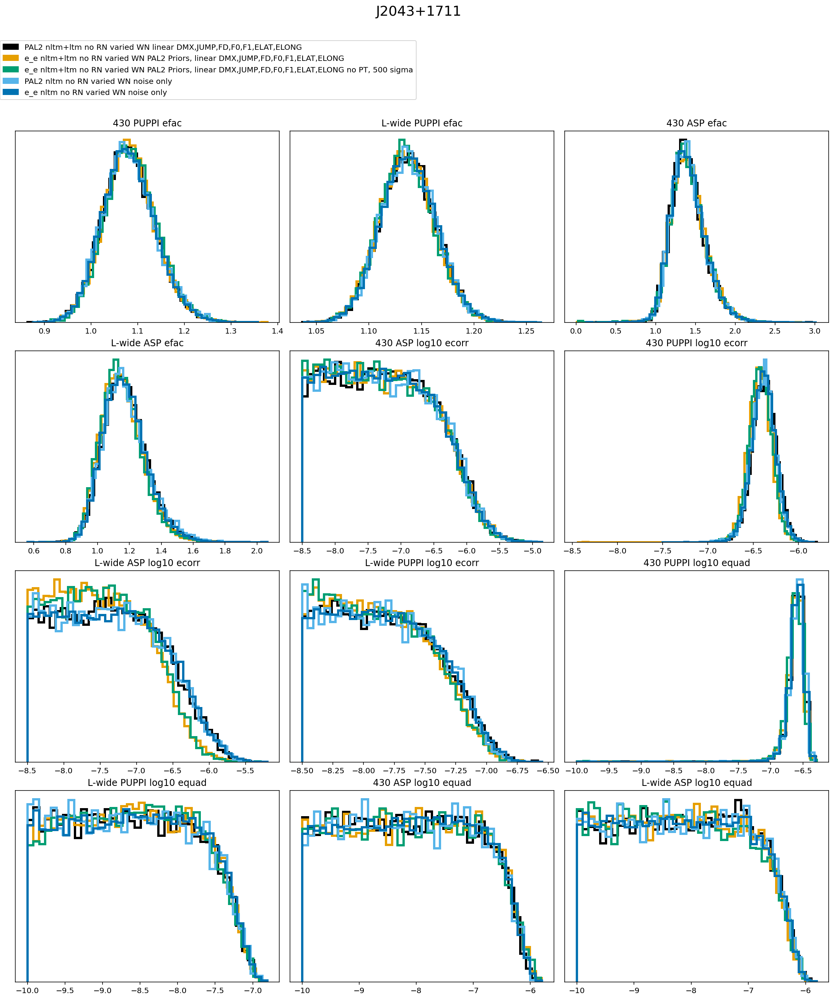

In [17]:
nltm_plt.plot_all_param_overlap(psr_name,
                                [core_list_9yr_PAL2[0],core_list_9yr_e_e[0],core_list_9yr_e_e[1],
                                 core_list_9yr_PAL2[1],core_list_9yr_e_e[2]],
                                core_list_legend = [core_list_legend_9yr_PAL2[0],core_list_legend_9yr_e_e[0],core_list_legend_9yr_e_e[1],
                                                    core_list_legend_9yr_PAL2[1],core_list_legend_9yr_e_e[2]])

In [18]:
core_list_9yr_PAL2[0].get_param_confint('J2043+1711_timing_model_PB',interval=90)

(1.4822907862446624, 1.4822907867766615)

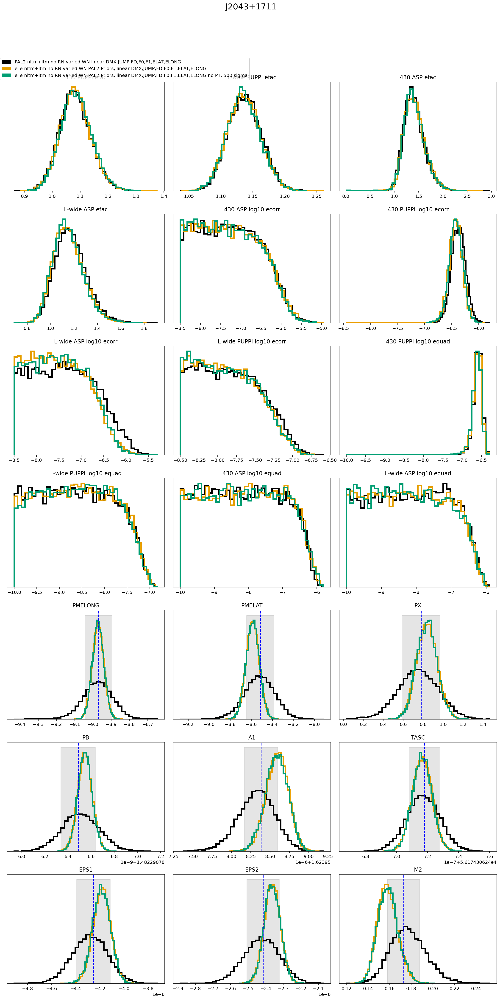

In [19]:
nltm_plt.plot_all_param_overlap(psr_name,
                                [core_list_9yr_PAL2[0],core_list_9yr_e_e[0],core_list_9yr_e_e[1]],
                                core_list_legend = [core_list_legend_9yr_PAL2[0],core_list_legend_9yr_e_e[0],core_list_legend_9yr_e_e[1]],
                               par_sigma=deepcopy(tm_params_orig))

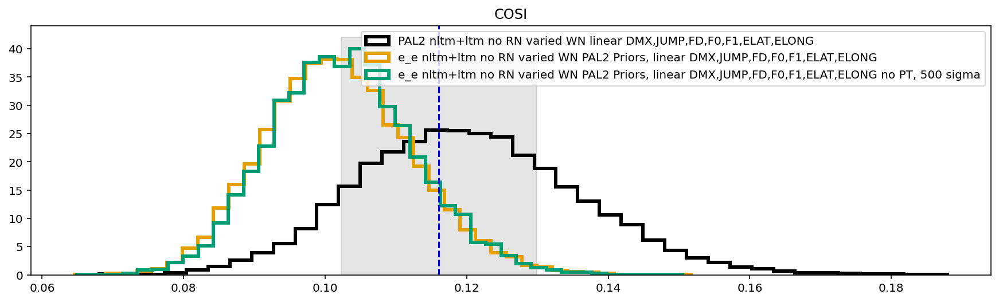

In [20]:
nltm_plt.plot_other_param_overlap(psr_name,
                                [core_list_9yr_PAL2[0],core_list_9yr_e_e[0],core_list_9yr_e_e[1]],
                                core_list_legend = [core_list_legend_9yr_PAL2[0],core_list_legend_9yr_e_e[0],core_list_legend_9yr_e_e[1]],
                               par_sigma=deepcopy(tm_params_orig))

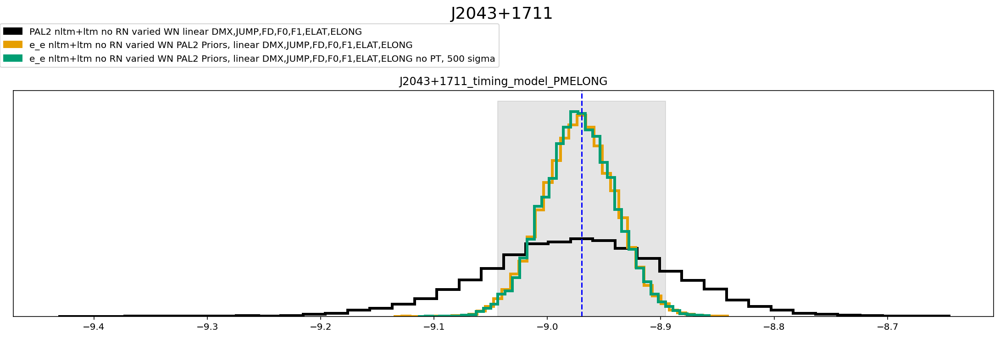

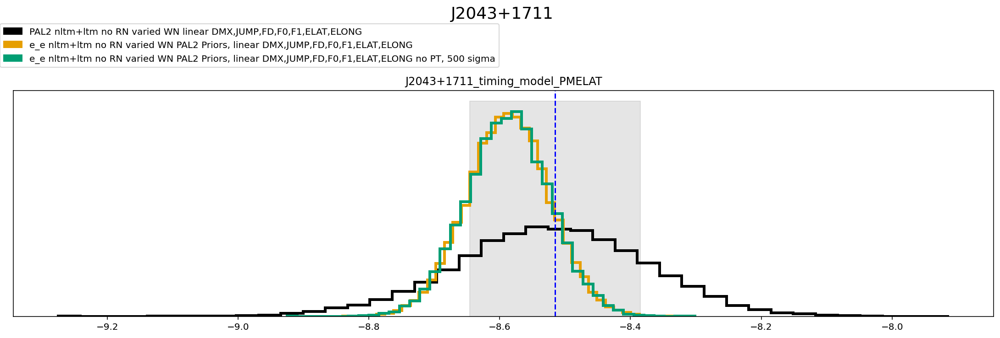

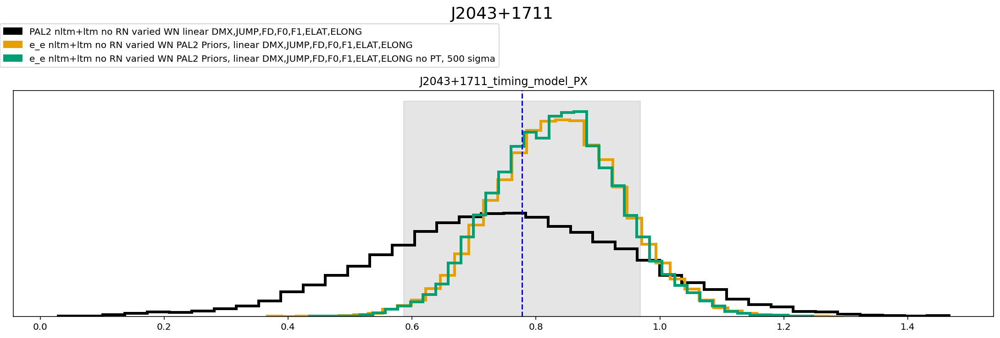

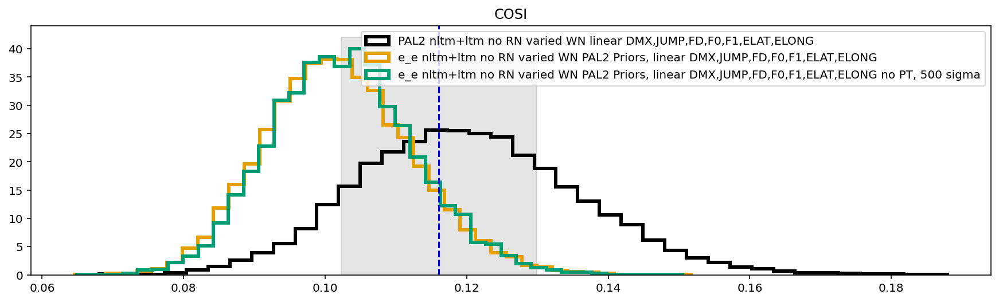

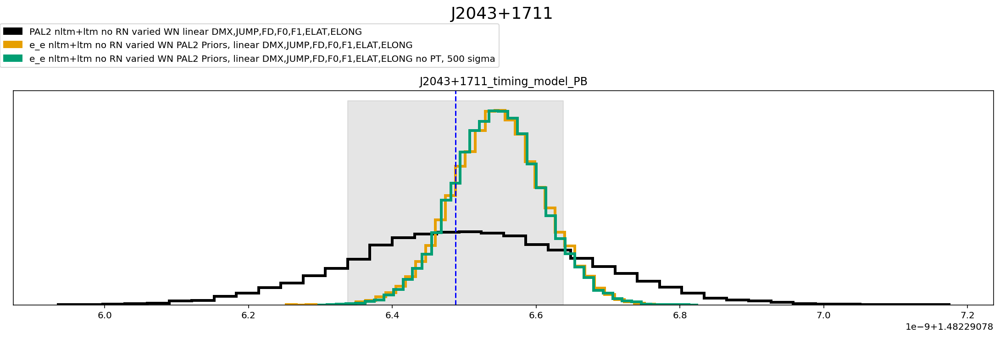

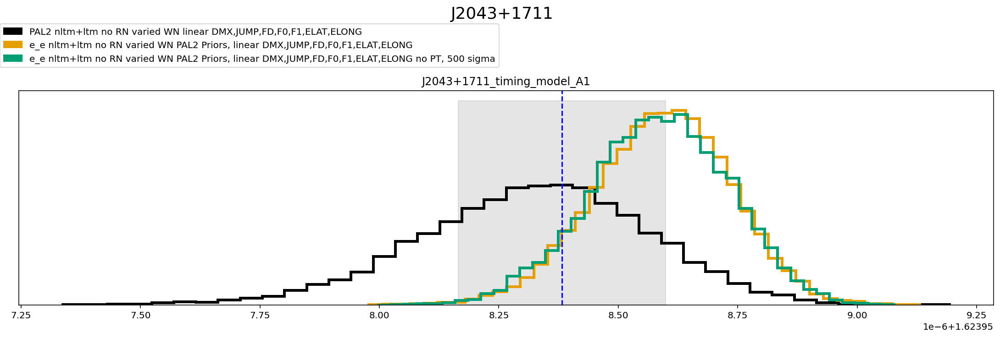

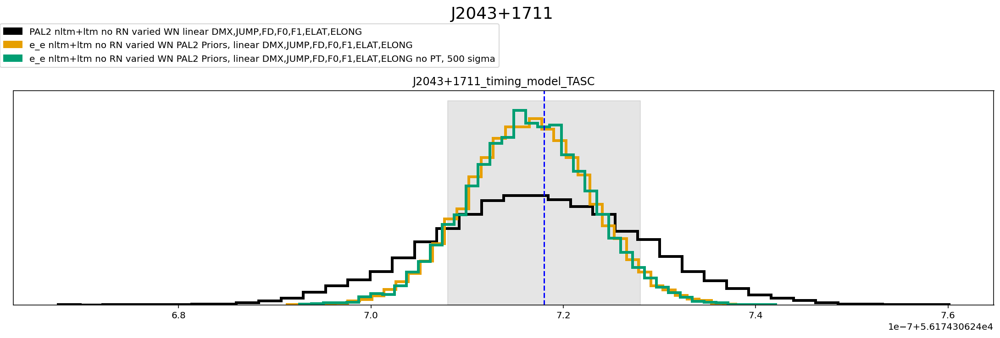

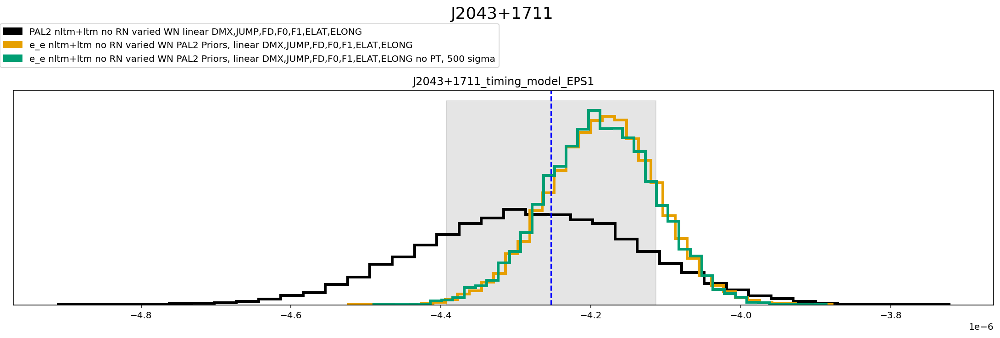

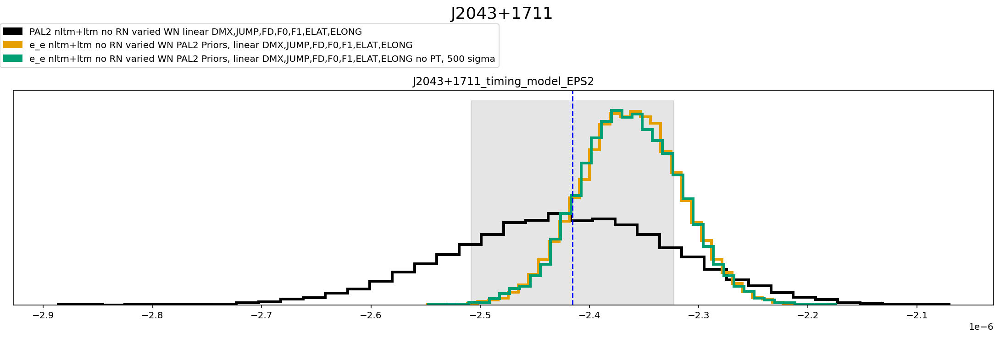

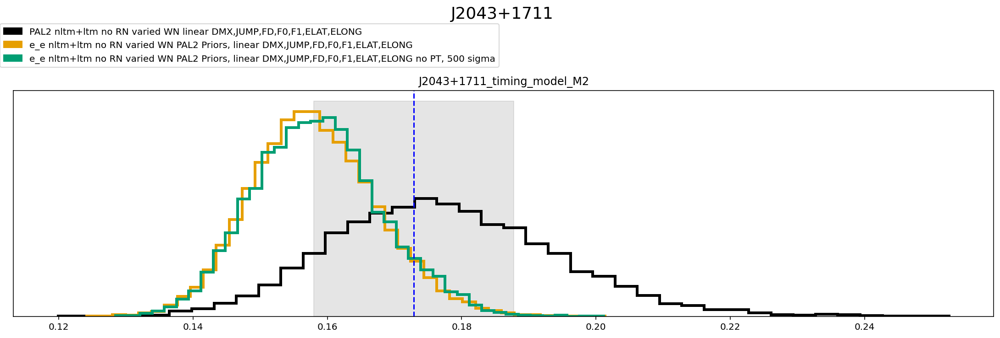

In [21]:
nltm_plt.plot_other_param_overlap(psr_name,
                                core_list_9yr_PAL2+core_list_9yr_e_e,
                                core_list_legend = core_list_legend_9yr_PAL2+ core_list_legend_9yr_e_e,
                                 par_sigma=deepcopy(tm_params_orig))

In [22]:
#c_PAL2 = core_PAL2_9yr_noRN_vary_WN_noise_only_1
c_PAL2 = core_PAL2_9yr_nltm_ltm_noRN_varyWN_lin_DMX_FD_JUMP_etc_1

#c_e_e = core_9yr_DE421_noRN_varyWN_noise_only_1
#c_e_e = core_9yr_DE421_noRN_varyWN_lin_DMX_FD_JUMP_etc_1
c_e_e = core_9yr_DE421_noRN_varyWN_lin_DMX_FD_JUMP_etc_500_sigma_1

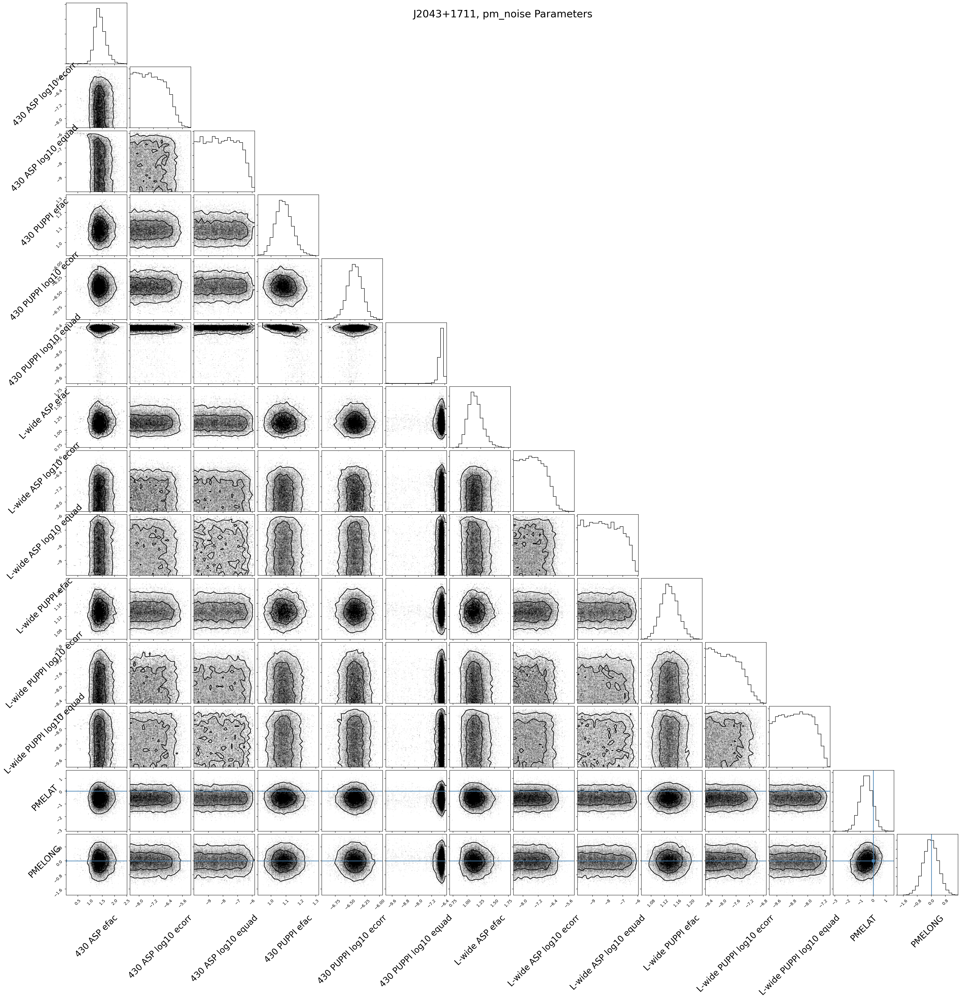

In [23]:
nltm_plt.corner_plots(psr_name,c_e_e,selection='pm_noise',save=False,tm_convert=False)

In [24]:
c_e_e_titles = nltm_plt.get_titles(psr_name,c_e_e)
map_idx_e_e = np.argmax(c_e_e.get_param('lnpost',to_burn=True))
map_dict_e_e = OrderedDict()
map_dict_e_e_scaled = OrderedDict()
mean_dict_e_e = OrderedDict()
for par in c_e_e.params:
    unscaled_param = c_e_e.get_param(par,to_burn=True)
    scaled_param = c_e_e.get_param(par,to_burn=True,tm_convert=False)
    map_dict_e_e_scaled[par] = scaled_param[map_idx_e_e]
    map_dict_e_e[par] = unscaled_param[map_idx_e_e]
    mean_dict_e_e[par] = np.mean(unscaled_param)

In [25]:
map_dict_e_e

OrderedDict([('J2043+1711_430_ASP_efac', 1.305893823135603),
             ('J2043+1711_430_ASP_log10_ecorr', -6.723023153430649),
             ('J2043+1711_430_ASP_log10_equad', -8.481771447168711),
             ('J2043+1711_430_PUPPI_efac', 1.0434625350938382),
             ('J2043+1711_430_PUPPI_log10_ecorr', -6.360878086288869),
             ('J2043+1711_430_PUPPI_log10_equad', -6.603371514657915),
             ('J2043+1711_L-wide_ASP_efac', 1.134462221040872),
             ('J2043+1711_L-wide_ASP_log10_ecorr', -7.339756605918925),
             ('J2043+1711_L-wide_ASP_log10_equad', -7.057739031489018),
             ('J2043+1711_L-wide_PUPPI_efac', 1.1330700452371187),
             ('J2043+1711_L-wide_PUPPI_log10_ecorr', -8.253082456944188),
             ('J2043+1711_L-wide_PUPPI_log10_equad', -7.725491224798581),
             ('J2043+1711_timing_model_A1', 1.6239585117323683),
             ('J2043+1711_timing_model_COSI', 0.10827844362062798),
             ('J2043+1711_timing_model_

COSI added to tm_params_orig for to work with tm_delay.
{'PMELONG': -8.971577622141570174, 'PMELAT': -8.587282856308899426, 'PX': 0.8358126220554887853, 'SINI': 0.99472581444665353345, 'PB': 1.4822907865467582766, 'A1': 1.6239585853078968292, 'TASC': 56174.306240716432512, 'EPS1': -4.1875042391950115025e-06, 'EPS2': -2.362529776734472699e-06, 'M2': 0.15853678810365554042}


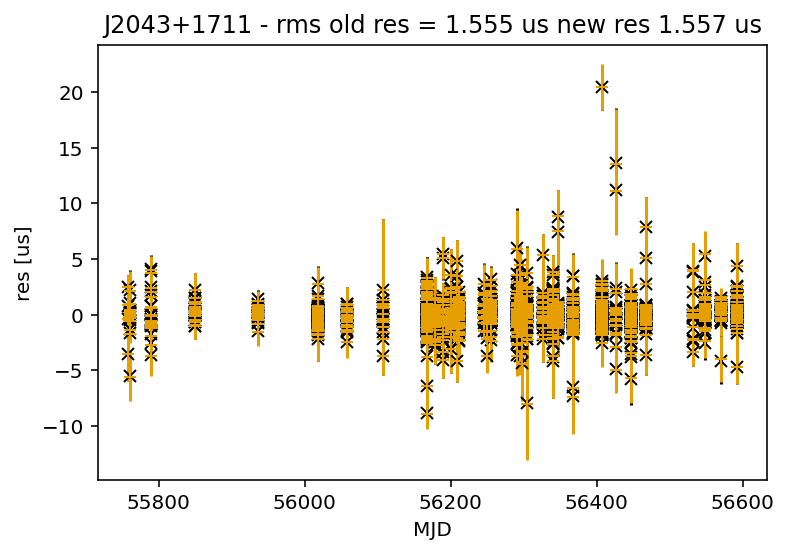

In [26]:
#use_map = True
use_map = False
if use_map:
    e_e_dict = deepcopy(map_dict_e_e)
else:
    e_e_dict = deepcopy(mean_dict_e_e)
try:
    chain_tm_params_orig = deepcopy(tm_params_orig)
    chain_tm_delay_kwargs = {}
    for par in psr.t2pulsar.pars():
        if par in c_e_e_titles:
            chain_tm_params_orig[par][-1] = 'physical'
            chain_tm_delay_kwargs[par] = e_e_dict[c_e_e.params[c_e_e_titles.index(par)]]
        elif par == 'SINI' and 'COSI' in c_e_e_titles:
            print("COSI added to tm_params_orig for to work with tm_delay.")
            sin_val, sin_err, _ = chain_tm_params_orig[par]
            val = np.longdouble(np.sqrt(1 - sin_val ** 2))
            err = np.longdouble(
                np.sqrt((np.abs(sin_val / val)) ** 2 * sin_err ** 2)
            )
            chain_tm_params_orig['COSI'] = [val, err, "physical"]
            chain_tm_delay_kwargs['COSI'] = e_e_dict[c_e_e.params[c_e_e_titles.index('COSI')]]
    nltm_plt.tm_delay(psr.t2pulsar,chain_tm_params_orig,**chain_tm_delay_kwargs);
    plt.show()
except:
    print("Noise only run? Can't do it.")

In [27]:
c_PAL2_titles = nltm_plt.get_titles(psr_name,c_PAL2)
map_idx_PAL2 = np.argmax(c_PAL2.get_param('lnpost',to_burn=True))
map_dict_PAL2 = OrderedDict()
mean_dict_PAL2 = OrderedDict()
for par in c_PAL2.params:
    unscaled_param = c_PAL2.get_param(par,to_burn=True)
    map_dict_PAL2[par] = unscaled_param[map_idx_PAL2]
    mean_dict_PAL2[par] = np.mean(unscaled_param)

{'PMELONG': -8.973764750759608333, 'PMELAT': -8.522433051225757339, 'PX': 0.7500968227498537866, 'SINI': 0.9925981302509586657, 'PB': 1.4822907865096424107, 'A1': 1.6239583219930926461, 'TASC': 56174.306240717160108, 'EPS1': -4.283170344600789374e-06, 'EPS2': -2.4240442327150571062e-06, 'M2': 0.17755347554482353578}


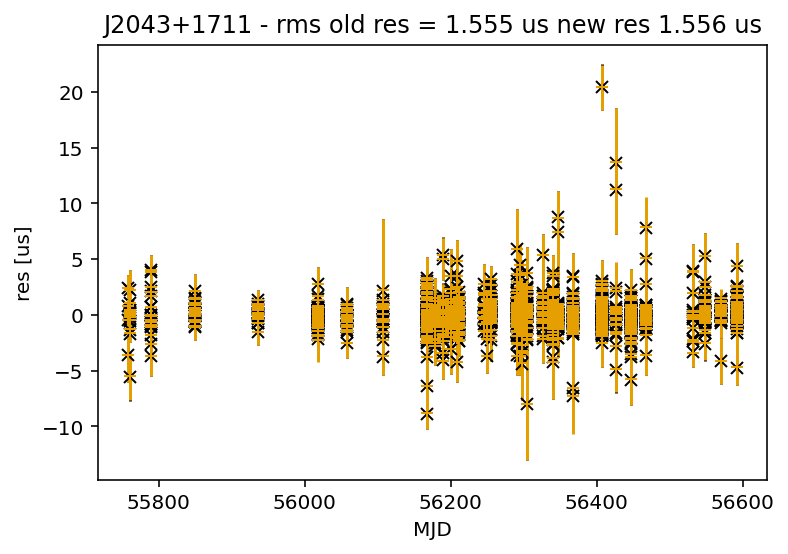

In [28]:
#use_map = True
use_map = False
if use_map:
    PAL2_dict = deepcopy(map_dict_PAL2)
else:
    PAL2_dict = deepcopy(mean_dict_PAL2)
try:
    PAL2_tm_params_orig = deepcopy(tm_params_orig)
    PAL2_tm_delay_kwargs = {}
    for par in psr.t2pulsar.pars():
        if par in c_PAL2_titles:
            PAL2_tm_params_orig[par][-1] = 'physical'
            PAL2_tm_delay_kwargs[par] = PAL2_dict[c_PAL2.params[c_PAL2_titles.index(par)]]
        elif par == 'SINI' and 'COSI' in c_PAL2_titles:
            print("COSI added to tm_params_orig for to work with tm_delay.")
            sin_val, sin_err, _ = PAL2_tm_params_orig[par]
            val = np.longdouble(np.sqrt(1 - sin_val ** 2))
            err = np.longdouble(
                np.sqrt((np.abs(sin_val / val)) ** 2 * sin_err ** 2)
            )
            PAL2_tm_params_orig['COSI'] = [val, err, "physical"]
            PAL2_tm_delay_kwargs['COSI'] = PAL2_dict[c_PAL2.params[c_PAL2_titles.index('COSI')]]

    nltm_plt.tm_delay(psr.t2pulsar,PAL2_tm_params_orig,**PAL2_tm_delay_kwargs);
    plt.show()
except:
    print("Noise only run? Can't do it.")

In [29]:
Fonseca_values = {
    'A1':1.6239584,
    'PB':1.48229078649,
    'ECC':0.00000489,
    'OM': 240.4,
    'T0': 56173.974,
    'EPS1':-0.00000425,
    'EPS2':-0.00000242,
    'TASC':56174.306240718,
    'h3':0.60,
    'squiggle':0.890,
    'Mp':1.41,
    'M2':0.175,
    'COSI':np.cos(83.2*np.pi/180)
}

{'PB': 1.4822907864899999009, 'A1': 1.6239584000000000241, 'TASC': 56174.306240717996843, 'EPS1': -4.2499999999999999665e-06, 'EPS2': -2.4200000000000001234e-06, 'M2': 0.1749999999999999889}


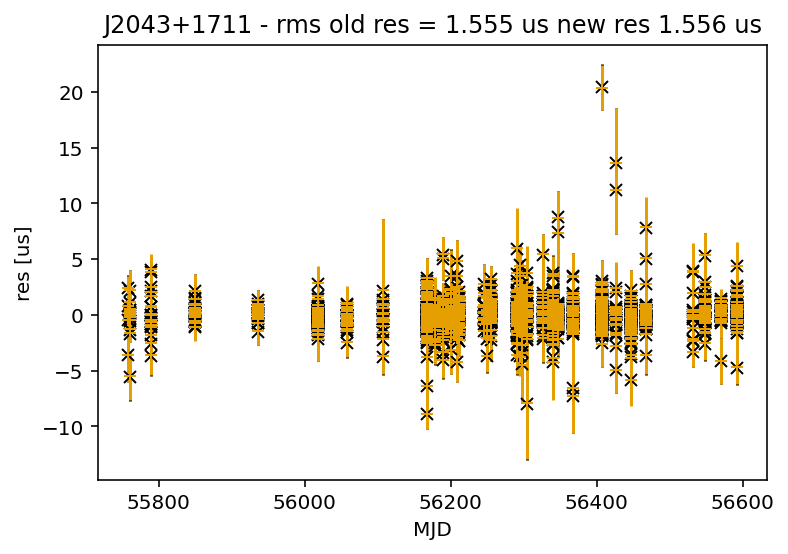

In [30]:
Fonseca_tm_params_orig = deepcopy(tm_params_orig)
Fonseca_tm_delay_kwargs = {}
for par in psr.t2pulsar.pars():
    if par in Fonseca_values.keys():
        Fonseca_tm_params_orig[par][-1] = 'physical'
        Fonseca_tm_delay_kwargs[par] = Fonseca_values[par]
    elif par == 'SINI' and 'COSI' in c_PAL2_titles:
        print("COSI added to tm_params_orig for to work with tm_delay.")
        sin_val, sin_err, _ = Fonseca_tm_params_orig[par]
        val = np.longdouble(np.sqrt(1 - sin_val ** 2))
        err = np.longdouble(
            np.sqrt((np.abs(sin_val / val)) ** 2 * sin_err ** 2)
        )
        Fonseca_tm_params_orig['COSI'] = [val, err, "physical"]
        Fonseca_tm_delay_kwargs['COSI'] = Fonseca_values['COSI']
    
nltm_plt.tm_delay(psr.t2pulsar,Fonseca_tm_params_orig,**Fonseca_tm_delay_kwargs);
plt.show()

In [31]:
print('Parameter \t\t NLTM MAP \t\t\t Fonseca et al. (2016)')
for par,val in chain_tm_delay_kwargs.items():
    if par in Fonseca_tm_delay_kwargs:
        print(f'{par}: \t\t',val,'\t\t\t',Fonseca_tm_delay_kwargs[par])
    else:
        print(f'{par}: \t\t',val,'\t\t\t','--')

Parameter 		 NLTM MAP 			 Fonseca et al. (2016)
PMELONG: 		 -8.97157762214157 			 --
PMELAT: 		 -8.5872828563089 			 --
PX: 		 0.8358126220554888 			 --
COSI: 		 0.10256975223447629 			 --
PB: 		 1.4822907865467583 			 1.48229078649
A1: 		 1.6239585853078968 			 1.6239584
TASC: 		 56174.30624071643 			 56174.306240718
EPS1: 		 -4.1875042391950115e-06 			 -4.25e-06
EPS2: 		 -2.3625297767344727e-06 			 -2.42e-06
M2: 		 0.15853678810365554 			 0.175


# Likelihood Comp

In [32]:
if 'noise_only' in c_PAL2.label:
    tm_var=False
else:
    tm_var=True

if 'no_tm' in c_PAL2.label:
    incTimingModel=False
else:
    incTimingModel=True
    
if 'full' in c_PAL2.label:
    lin_dmx_jump_fd=False
else:
    lin_dmx_jump_fd=True

psr_reload = Pulsar(parfile, timfile, ephem=ephem, clk=None, drop_t2pulsar=False)
pta = pta_setup(psr_reload,datarelease="9yr",psr_name=psr_name,
                tm_var=tm_var,red_var=False,
                white_var=True,fit_remaining_pars=True,
                lin_dmx_jump_fd=lin_dmx_jump_fd,
                tm_linear=False,
                incTimingModel=incTimingModel,Ecorr_gp_basis=False)

Non-linearly varying these values:  ['PMELONG', 'PMELAT', 'PX', 'COSI', 'PB', 'A1', 'TASC', 'EPS1', 'EPS2', 'M2'] 
 in pulsar  J2043+1711
Linearly varying these values:  ['Offset', 'ELONG', 'ELAT', 'F0', 'F1', 'FD1', 'DMX_0001', 'DMX_0002', 'DMX_0003', 'DMX_0004', 'DMX_0005', 'DMX_0006', 'DMX_0007', 'DMX_0008', 'DMX_0009', 'DMX_0010', 'DMX_0011', 'DMX_0012', 'DMX_0013', 'DMX_0014', 'DMX_0015', 'DMX_0016', 'DMX_0017', 'DMX_0018', 'DMX_0019', 'DMX_0020', 'DMX_0021', 'DMX_0022', 'DMX_0023', 'JUMP1']
Using  uniform  prior.
COSI added to tm_params_orig for to work with tm_delay.


In [33]:
exlude_params = ['lnpost','lnlike','chain_accept','pt_chain_accept']
nltm_timing_run_name = 'PAL2_nltm_ltm_noRN_varyWN_lin_DMX_FD_JUMP_etc_mark9_like_test_1'
nltm_timing_outDir="/home/andrew/Documents/Research/nanograv/enterprise_timing/{}/ark_PAL2/{}".format(psr_name,nltm_timing_run_name)

```
with open(nltm_timing_outDir+'/map_dict_PAL2.json','w') as f:
    json.dump(map_dict_PAL2,f)
copy_tm_params_orig = deepcopy(tm_params_orig)
for key, val in copy_tm_params_orig.items():
    for i,num in enumerate(val[:-1]):
        copy_tm_params_orig[key][i] = np.double(num)
with open(nltm_timing_outDir+'/tm_params_orig.json','w') as f:
    json.dump(copy_tm_params_orig,f)
```

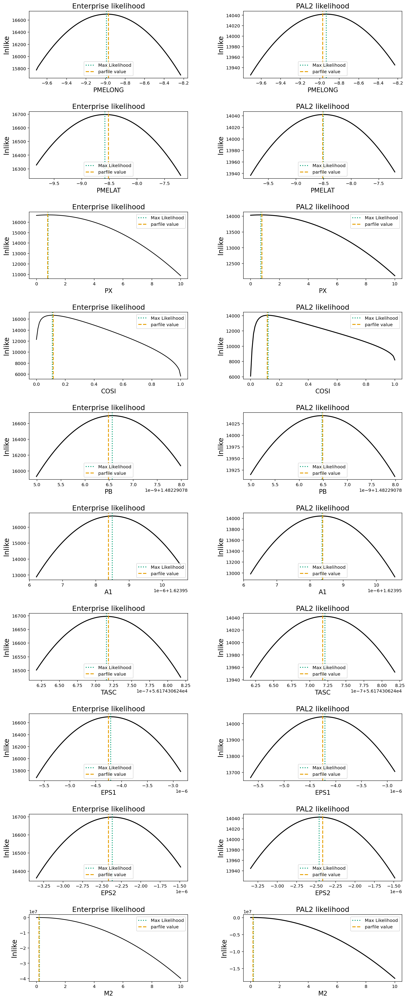

In [34]:
grid_params = ['PMELONG', 'PMELAT', 'PX', 'COSI', 'PB', 'A1', 'TASC', 'EPS1', 'EPS2', 'M2']
scale = 10
num = 100
fig,ax = plt.subplots(len(grid_params),2,figsize=(15,4*len(grid_params)))
for i,grid_param in enumerate(grid_params):
    if c_e_e.tm_pars_orig[grid_param][-1] == 'physical':
        if grid_param in ['COSI','SINI']:
            grid_array = np.linspace(0.,1.,num=num)
            sin_val, _, _ = tm_params_orig["SINI"]
            truth = np.longdouble(np.sqrt(1 - sin_val ** 2))
        elif grid_param in ['M2','PX']:
            grid_array = np.linspace(0.0001,10.,num=num)
            truth = tm_params_orig[grid_param][0]
        else:
            grid_array = np.linspace(tm_params_orig[grid_param][0]-scale*tm_params_orig[grid_param][1],
                                    tm_params_orig[grid_param][0]+scale*tm_params_orig[grid_param][1],
                                    num=num)
            truth = tm_params_orig[grid_param][0]
        shift = False
    else:
        grid_array = np.linspace(-scale,scale,num=num)
        truth = tm_params_orig[grid_param][0]
        shifter = tm_params_orig[grid_param][1]
        shift = True
        
    #print(grid_array)
    grid_lnlike_array = []
    grid_map_dict = deepcopy(map_dict_e_e_scaled)

    for grid_point in grid_array:
        x0 = []
        for key,val in grid_map_dict.items():
            if key not in exlude_params:
                if key.split('_')[-1] == grid_param:
                    x0.append(grid_point)
                else:
                    x0.append(val)
        #for nm, p in zip(grid_map_dict.keys(),x0):
        #    print(nm,p)
        grid_lnlike = pta.get_lnlikelihood({nm:p for nm, p in zip(grid_map_dict.keys(),x0)})
        grid_lnlike_array.append(grid_lnlike)

    if grid_param == 'COSI':
        PAL2_grid_lnlike = np.load(nltm_timing_outDir+f'/SINI_grid_lnlike.npz')
    else:
        PAL2_grid_lnlike = np.load(nltm_timing_outDir+f'/{grid_param}_grid_lnlike.npz')

    if shift:
        shifted_grid_array = truth + grid_array*shifter
        ax[i][0].plot(shifted_grid_array,grid_lnlike_array,linewidth=2)
        ax[i][0].axvline(x=shifted_grid_array[np.argmax(grid_lnlike_array)],linestyle=':',linewidth=2,color='C2',label='Max Likelihood')
    else:
        ax[i][0].plot(grid_array,grid_lnlike_array)
        ax[i][0].axvline(x=grid_array[np.argmax(grid_lnlike_array)],linestyle=':',linewidth=2,color='C2',label='Max Likelihood')
    ax[i][0].axvline(x=truth,linestyle='--',linewidth=2,color='C1',label='parfile value')
    ax[i][0].set_title('Enterprise likelihood',fontsize=16)
    ax[i][0].set_xlabel(f'{grid_param}',fontsize=14)
    ax[i][0].set_ylabel('lnlike',fontsize=16)
    ax[i][0].legend()
    
    if grid_param == 'COSI':
        cosi_grid = np.sqrt(1-PAL2_grid_lnlike['grid_array']**2)
        ax[i][1].plot(cosi_grid,PAL2_grid_lnlike['grid_lnlike_array'],linewidth=2)
        ax[i][1].axvline(x=cosi_grid[np.argmax(PAL2_grid_lnlike['grid_lnlike_array'])],
                      linestyle=':',linewidth=2,color='C2',label='Max Likelihood')
    else:
        ax[i][1].plot(PAL2_grid_lnlike['grid_array'],PAL2_grid_lnlike['grid_lnlike_array'],linewidth=2)
        ax[i][1].axvline(x=PAL2_grid_lnlike['grid_array'][np.argmax(PAL2_grid_lnlike['grid_lnlike_array'])],
                      linestyle=':',linewidth=2,color='C2',label='Max Likelihood')
    ax[i][1].axvline(x=truth,linestyle='--',linewidth=2,color='C1',label='parfile value')
    ax[i][1].set_title(f'PAL2 likelihood',fontsize=16)
    ax[i][1].set_xlabel(f'{grid_param}',fontsize=14)
    ax[i][1].set_ylabel('lnlike',fontsize=16)
    ax[i][1].legend()

plt.subplots_adjust(wspace=0.35,hspace=0.5)
plt.show()
plt.close()

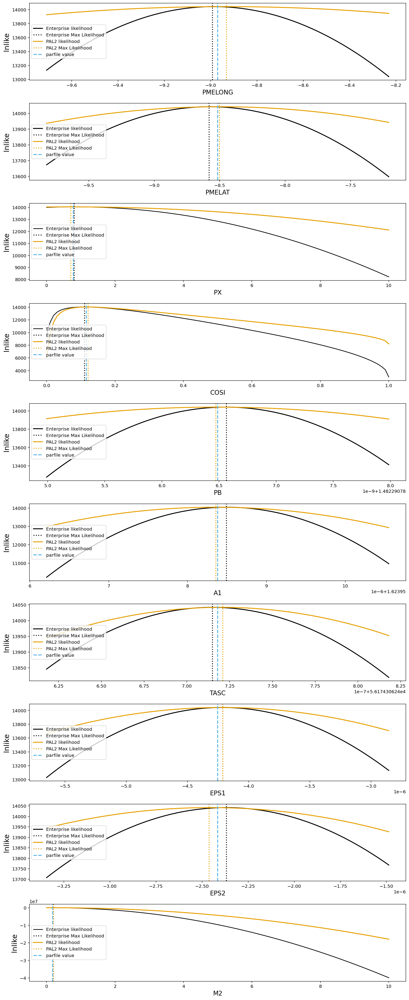

In [35]:
grid_params = ['PMELONG', 'PMELAT', 'PX', 'COSI', 'PB', 'A1', 'TASC', 'EPS1', 'EPS2', 'M2']
scale = 10
num = 100
fig,ax = plt.subplots(len(grid_params),1,figsize=(15,4*len(grid_params)))
for i,grid_param in enumerate(grid_params):
    if c_e_e.tm_pars_orig[grid_param][-1] == 'physical':
        if grid_param in ['COSI','SINI']:
            grid_array = np.linspace(0.,1.,num=num)
            sin_val, _, _ = tm_params_orig["SINI"]
            truth = np.longdouble(np.sqrt(1 - sin_val ** 2))
        elif grid_param in ['M2','PX']:
            grid_array = np.linspace(0.0001,10.,num=num)
            truth = tm_params_orig[grid_param][0]
        else:
            grid_array = np.linspace(tm_params_orig[grid_param][0]-scale*tm_params_orig[grid_param][1],
                                    tm_params_orig[grid_param][0]+scale*tm_params_orig[grid_param][1],
                                    num=num)
            truth = tm_params_orig[grid_param][0]
        shift = False
    else:
        grid_array = np.linspace(-scale,scale,num=num)
        truth = tm_params_orig[grid_param][0]
        shifter = tm_params_orig[grid_param][1]
        shift = True
        
    #print(grid_array)
    grid_lnlike_array = []
    grid_map_dict = deepcopy(map_dict_e_e_scaled)

    for grid_point in grid_array:
        x0 = []
        for key,val in grid_map_dict.items():
            if key not in exlude_params:
                if key.split('_')[-1] == grid_param:
                    x0.append(grid_point)
                else:
                    x0.append(val)
        #for nm, p in zip(grid_map_dict.keys(),x0):
        #    print(nm,p)
        grid_lnlike = pta.get_lnlikelihood({nm:p for nm, p in zip(grid_map_dict.keys(),x0)})
        grid_lnlike_array.append(grid_lnlike)

    if grid_param == 'COSI':
        PAL2_grid_lnlike = np.load(nltm_timing_outDir+f'/SINI_grid_lnlike.npz')
    else:
        PAL2_grid_lnlike = np.load(nltm_timing_outDir+f'/{grid_param}_grid_lnlike.npz')

    vert_shift = np.unique(np.max(PAL2_grid_lnlike['grid_lnlike_array']))-np.unique(np.max(grid_lnlike_array))
    
    if shift:
        shifted_grid_array = truth + grid_array*shifter
        ax[i].plot(shifted_grid_array,grid_lnlike_array+vert_shift,linewidth=2,label='Enterprise likelihood')
        ax[i].axvline(x=shifted_grid_array[np.argmax(grid_lnlike_array)],linestyle=':',linewidth=2,color='C0',label='Enterprise Max Likelihood')
    else:
        ax[i].plot(grid_array,grid_lnlike_array+vert_shift,label='Enterprise likelihood')
        ax[i].axvline(x=grid_array[np.argmax(grid_lnlike_array)],linestyle=':',linewidth=2,color='C0',label='Enterprise Max Likelihood')
    
    if grid_param == 'COSI':
        cosi_grid = np.sqrt(1-PAL2_grid_lnlike['grid_array']**2)
        ax[i].plot(cosi_grid,PAL2_grid_lnlike['grid_lnlike_array'],linewidth=2,label='PAL2 likelihood')
        ax[i].axvline(x=cosi_grid[np.argmax(PAL2_grid_lnlike['grid_lnlike_array'])],
                      linestyle=':',linewidth=2,color='C1',label='PAL2 Max Likelihood')
    else:
        ax[i].plot(PAL2_grid_lnlike['grid_array'],PAL2_grid_lnlike['grid_lnlike_array'],linewidth=2,label='PAL2 likelihood')
        ax[i].axvline(x=PAL2_grid_lnlike['grid_array'][np.argmax(PAL2_grid_lnlike['grid_lnlike_array'])],
                      linestyle=':',linewidth=2,color='C1',label='PAL2 Max Likelihood')
    ax[i].axvline(x=truth,linestyle='--',linewidth=2,color='C3',label='parfile value')
    ax[i].set_xlabel(f'{grid_param}',fontsize=14)
    ax[i].set_ylabel('lnlike',fontsize=16)
    ax[i].legend(loc='center left')

plt.subplots_adjust(hspace=0.3)
plt.show()
plt.close()

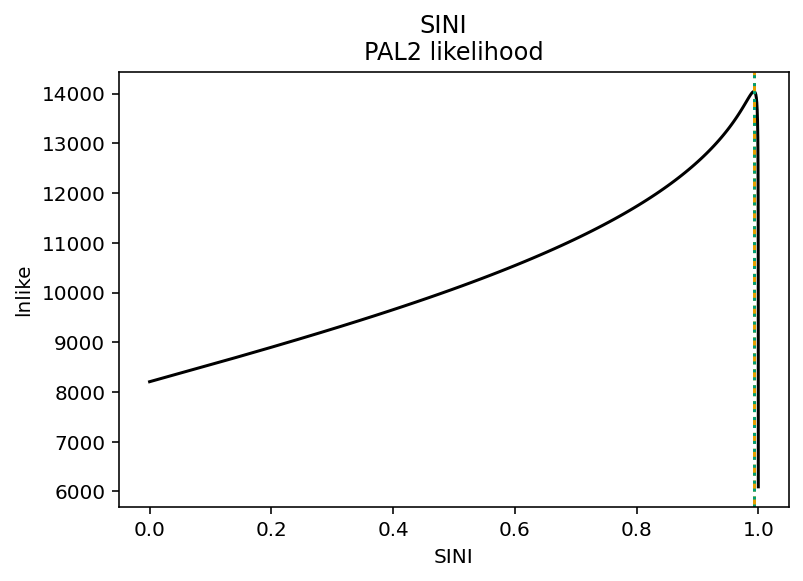

In [36]:
grid_param = 'SINI'
PAL2_grid_lnlike = np.load(nltm_timing_outDir+f'/{grid_param}_grid_lnlike.npz')

plt.plot(PAL2_grid_lnlike['grid_array'],PAL2_grid_lnlike['grid_lnlike_array'])
plt.axvline(x=tm_params_orig[grid_param][0],linestyle='--',color='C1')
plt.axvline(x=PAL2_grid_lnlike['grid_array'][np.argmax(PAL2_grid_lnlike['grid_lnlike_array'])],
              linestyle=':',color='C2')
plt.title(f'PAL2 likelihood')
plt.xlabel(f'{grid_param}')
plt.ylabel('lnlike')
plt.suptitle(f'{grid_param}')
plt.show()
plt.close()

In [37]:
pta.params

[J2043+1711_430_ASP_efac:Uniform(pmin=0.001, pmax=10.0),
 J2043+1711_430_ASP_log10_ecorr:Uniform(pmin=-8.5, pmax=-4.0),
 J2043+1711_430_ASP_log10_equad:Uniform(pmin=-10.0, pmax=-4.0),
 J2043+1711_430_PUPPI_efac:Uniform(pmin=0.001, pmax=10.0),
 J2043+1711_430_PUPPI_log10_ecorr:Uniform(pmin=-8.5, pmax=-4.0),
 J2043+1711_430_PUPPI_log10_equad:Uniform(pmin=-10.0, pmax=-4.0),
 J2043+1711_L-wide_ASP_efac:Uniform(pmin=0.001, pmax=10.0),
 J2043+1711_L-wide_ASP_log10_ecorr:Uniform(pmin=-8.5, pmax=-4.0),
 J2043+1711_L-wide_ASP_log10_equad:Uniform(pmin=-10.0, pmax=-4.0),
 J2043+1711_L-wide_PUPPI_efac:Uniform(pmin=0.001, pmax=10.0),
 J2043+1711_L-wide_PUPPI_log10_ecorr:Uniform(pmin=-8.5, pmax=-4.0),
 J2043+1711_L-wide_PUPPI_log10_equad:Uniform(pmin=-10.0, pmax=-4.0),
 J2043+1711_timing_model_A1:Uniform(pmin=-500.0, pmax=500.0),
 J2043+1711_timing_model_COSI:Uniform(pmin=0.0, pmax=1.0),
 J2043+1711_timing_model_EPS1:Uniform(pmin=-500.0, pmax=500.0),
 J2043+1711_timing_model_EPS2:Uniform(pmin=-500.0

In [38]:
map_dict_PAL2

OrderedDict([('J2043+1711_430_PUPPI_efac', 1.0765101818127343),
             ('J2043+1711_L-wide_PUPPI_efac', 1.1331843035585305),
             ('J2043+1711_430_ASP_efac', 1.3237196642226283),
             ('J2043+1711_L-wide_ASP_efac', 1.0503252888183892),
             ('J2043+1711_430_ASP_log10_ecorr', -7.416714232982445),
             ('J2043+1711_430_PUPPI_log10_ecorr', -6.361197450284246),
             ('J2043+1711_L-wide_ASP_log10_ecorr', -8.156139680940587),
             ('J2043+1711_L-wide_PUPPI_log10_ecorr', -7.906615973073083),
             ('J2043+1711_430_PUPPI_log10_equad', -6.553251769266682),
             ('J2043+1711_L-wide_PUPPI_log10_equad', -8.232873728685849),
             ('J2043+1711_430_ASP_log10_equad', -8.415391259494108),
             ('J2043+1711_L-wide_ASP_log10_equad', -7.4202965510327905),
             ('J2043+1711_timing_model_PMELONG', -8.945328714524484),
             ('J2043+1711_timing_model_PMELAT', -8.437928438127242),
             ('J2043+1711_timi

In [39]:
updated_map_dict_PAL2 = OrderedDict()
for i,(par,x) in enumerate(map_dict_PAL2.items()):
    for normed_pars in c_e_e._norm_tm_par_idxs:
        if par == c_e_e.params[normed_pars]:
            if 'SINI' in par:
                new_par = ('_').join(par.split('_')[:-1] + ['COSI'])
                val, err, _ = c_e_e.tm_pars_orig['COSI']
                updated_map_dict_PAL2[new_par] = (np.sqrt(1-x**2) - val)/err
            else:
                val, err, _ = c_e_e.tm_pars_orig[c_e_e._get_real_tm_par_name(par)]
                updated_map_dict_PAL2[par] = (x - val)/err
    if par not in updated_map_dict_PAL2.keys():
        if 'SINI' in par and par != ('_').join(par.split('_')[:-1] + ['COSI']):
            print('here')
            new_par = ('_').join(par.split('_')[:-1] + ['COSI'])
            updated_map_dict_PAL2[new_par] = np.sqrt(1-x**2)
        else:
            updated_map_dict_PAL2[par] = x
    
max_lnlike = pta.get_lnlikelihood({p:v for p, v in updated_map_dict_PAL2.items() if p not in exlude_params})
max_lnprior = pta.get_lnprior({p:v for p, v in updated_map_dict_PAL2.items() if p not in exlude_params})

print(map_dict_e_e['lnlike'],map_dict_e_e['lnpost'])
print(map_dict_PAL2['lnlike'],map_dict_PAL2['lnpost'])
print(max_lnlike,max_lnlike+max_lnprior)

here
16697.640818 16620.296482
18066.459659 18086.023268
16687.975439715054 16610.631103806722


Here we take n_samples of chain slices from the PAL2 chain to get the parameter values at each slice. Then for that set of parameters/values, we calculate the likelihood and prior in Enterprise. 

In [40]:
print(c_PAL2.chain[28394,:-5])

[ 1.02361760e+00  1.13538097e+00  1.63044035e+00  1.32383785e+00
 -8.49070397e+00 -6.41852812e+00 -7.15369422e+00 -7.77778324e+00
 -6.55737392e+00 -7.89064609e+00 -6.41797034e+00 -8.77996665e+00
 -8.98496845e+00 -8.42920146e+00  9.69094787e-01  9.93954612e-01
  1.48229079e+00  1.62395860e+00  5.61743062e+04 -4.28284585e-06
 -2.34324006e-06  1.64021566e-01]


In [41]:
PAL2_lnlike_array = []
PAL2_lnprior_array = []
n_samples = 1000
for idx in np.random.randint(c_PAL2.burn, c_PAL2.chain.shape[0],n_samples):
    x0 = c_PAL2.chain[idx,:-5]
    sin_used = False
    for (i,x),par in zip(enumerate(x0),map_dict_PAL2.keys()):
        for normed_pars in c_e_e._norm_tm_par_idxs:
            if par == c_e_e.params[normed_pars]:
                if 'SINI' in par:
                    val, err, _ = c_e_e.tm_pars_orig['COSI']
                    x0[i] = (np.sqrt(1-c_PAL2.chain[idx,i]**2) - val)/err
                    sin_used = True
                else:
                    val, err, _ = c_e_e.tm_pars_orig[c_e_e._get_real_tm_par_name(par)]
                    x0[i] = (c_PAL2.chain[idx,i] - val)/err
        if 'SINI' in par and not sin_used:
            x0[i] = np.sqrt(1-c_PAL2.chain[idx,i]**2)
    
    PAL2_lnlike = pta.get_lnlikelihood({nm:p for nm, p in zip(updated_map_dict_PAL2.keys(),x0)})
    PAL2_lnprior = pta.get_lnprior({nm:p for nm, p in zip(updated_map_dict_PAL2.keys(),x0)})
    if PAL2_lnlike > 0:
        PAL2_lnlike_array.append(PAL2_lnlike)
        PAL2_lnprior_array.append(PAL2_lnprior)
"""
    else:
        [print(x,': ',y) for x,y in zip(updated_map_dict_PAL2.keys(),x0)]
        print(idx)
        print('-----')
        #print(PAL2_lnprior)
        print(PAL2_lnlike,c_PAL2.chain[idx,-4])
        #print(c_PAL2.chain[idx,-4]-PAL2_lnlike)
        #print(c_PAL2.chain[idx,-5]-c_PAL2.chain[idx,-4])
        #print(PAL2_lnlike+PAL2_lnprior,c_PAL2.chain[idx,-5])
        print('-----')
"""

"""
for idx in np.random.randint(nihan.burn, nihan.chain.shape[0],20):
    x0 = nihan.chain[idx,:-4]
#     print(x0)
    lnlike = pta.get_lnlikelihood({nm:p for nm, p in zip(pta.param_names,x0)})
    lnprior = pta.get_lnprior({nm:p for nm, p in zip(pta.param_names,x0)})
    print(lnprior)
    print(lnlike,nihan.chain[idx,-3])
    print(lnlike+lnprior,nihan.chain[idx,-4])
    print('-----')
"""

/home/andrew/anaconda3/envs/enterprise/lib/python3.7/site-packages/enterprise/signals/parameter.py:62: RuntimeWarning: divide by zero encountered in log
  logpdf = np.log(self.prior(value, **kwargs))


"\nfor idx in np.random.randint(nihan.burn, nihan.chain.shape[0],20):\n    x0 = nihan.chain[idx,:-4]\n#     print(x0)\n    lnlike = pta.get_lnlikelihood({nm:p for nm, p in zip(pta.param_names,x0)})\n    lnprior = pta.get_lnprior({nm:p for nm, p in zip(pta.param_names,x0)})\n    print(lnprior)\n    print(lnlike,nihan.chain[idx,-3])\n    print(lnlike+lnprior,nihan.chain[idx,-4])\n    print('-----')\n"

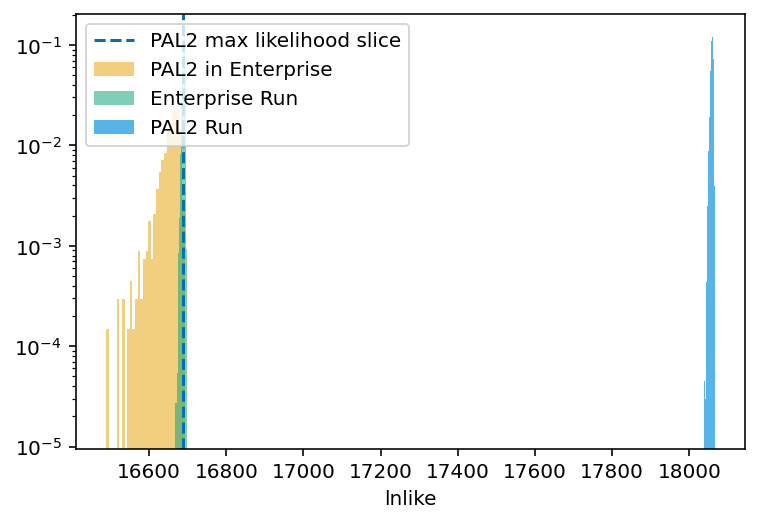

In [42]:
plt.hist(PAL2_lnlike_array,bins=30,density=True,log=True,label='PAL2 in Enterprise',color='C1',alpha=.5)
plt.hist(c_e_e.get_param('lnlike'),bins=30,density=True,log=True,label='Enterprise Run',color='C2',alpha=.5)
plt.hist(c_PAL2.get_param('lnlike'),bins=30,density=True,log=True,label='PAL2 Run',color='C3')
plt.axvline(x=max_lnlike,color='C4',label='PAL2 max likelihood slice',linestyle='--')
plt.xlabel('lnlike')
plt.legend(loc='upper left')
plt.show()

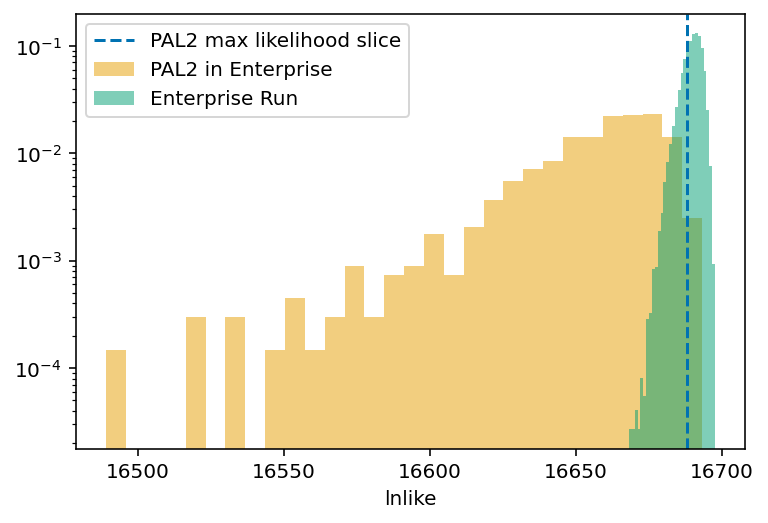

In [43]:
plt.hist(PAL2_lnlike_array,bins=30,density=True,log=True,label='PAL2 in Enterprise',color='C1',alpha=.5)
plt.hist(c_e_e.get_param('lnlike'),bins=30,density=True,log=True,label='Enterprise Run',color='C2',alpha=.5)
#plt.hist(c_PAL2.get_param('lnlike'),bins=30,density=True,log=True,label='PAL2 Run',color='C3')
plt.axvline(x=max_lnlike,color='C4',label='PAL2 max likelihood slice',linestyle='--')
plt.xlabel('lnlike')
plt.legend(loc='upper left')
plt.show()

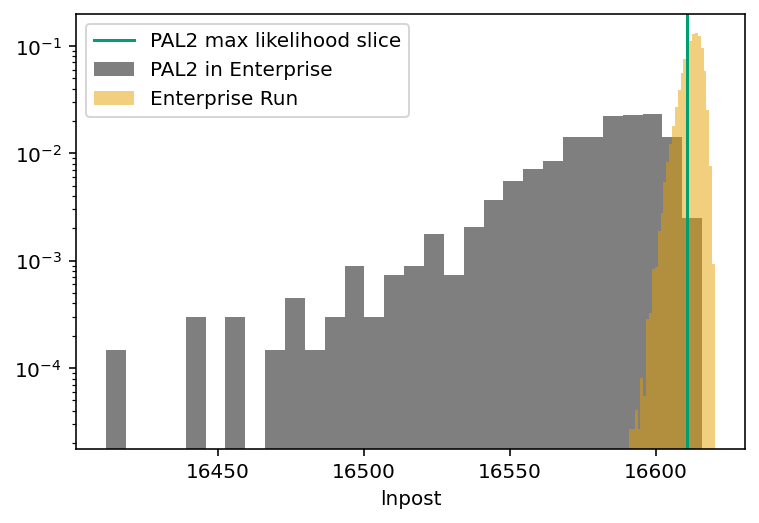

In [44]:
plt.hist(np.asarray(PAL2_lnlike_array)+np.asarray(PAL2_lnprior_array),bins=30,density=True,log=True,label='PAL2 in Enterprise',alpha=.5)
plt.hist(c_e_e.get_param('lnpost'),bins=30,density=True,log=True,label='Enterprise Run',alpha=.5)
plt.axvline(x=max_lnlike+max_lnprior,color='C2',label='PAL2 max likelihood slice')
plt.xlabel('lnpost')
plt.legend()
plt.show()

In [45]:
print('Parameter \t\t NLTM MAP \t\t PAL2 PAL2 MAP \t\t Rel Diff abs(PAL2-NLTM)/PAL2')
for par,val in chain_tm_delay_kwargs.items():
    if par in PAL2_tm_delay_kwargs:
        print(f'{par}: \t\t',val,'\t\t',PAL2_tm_delay_kwargs[par],'\t\t',
              np.abs(PAL2_tm_delay_kwargs[par]-val)/PAL2_tm_delay_kwargs[par])
    elif par == 'COSI':
        print(f'{par}: \t\t',val,'\t\t',np.sqrt(1-PAL2_tm_delay_kwargs['SINI']**2),'\t\t',
              np.abs(np.sqrt(1-PAL2_tm_delay_kwargs['SINI']**2)-val)/np.sqrt(1-PAL2_tm_delay_kwargs['SINI']**2))
    else:
        print(f'{par}: \t\t',val,'\t\t','--')

Parameter 		 NLTM MAP 		 PAL2 PAL2 MAP 		 Rel Diff abs(PAL2-NLTM)/PAL2
PMELONG: 		 -8.97157762214157 		 -8.973764750759608 		 -0.00024372475530440259
PMELAT: 		 -8.5872828563089 		 -8.522433051225757 		 -0.007609306484820661
PX: 		 0.8358126220554888 		 0.7500968227498538 		 0.11427298010862252
COSI: 		 0.10256975223447629 		 0.12144526265894791 		 0.1554240158175565
PB: 		 1.4822907865467583 		 1.4822907865096424 		 2.5039530889644483e-11
A1: 		 1.6239585853078968 		 1.6239583219930926 		 1.6214381897430735e-07
TASC: 		 56174.30624071643 		 56174.30624071716 		 1.2952465461708809e-14
EPS1: 		 -4.1875042391950115e-06 		 -4.283170344600789e-06 		 -0.022335349217752015
EPS2: 		 -2.3625297767344727e-06 		 -2.424044232715057e-06 		 -0.025376787746024327
M2: 		 0.15853678810365554 		 0.17755347554482354 		 0.10710399997981011
